# Business Objective

This projects aims to predict if the customer is likely to cancel their reservation at Hotel INN or not. This may help the Hotel better allocate their resources and/or offer discounts or special prices to their loyal customer base. 

## Import the necessary packages

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path
from scipy.stats import probplot, chi2_contingency, chi2
import warnings

import scipy.stats as stats

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, cross_val_predict
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.inspection import permutation_importance

import scikitplot as skplt
from yellowbrick.model_selection import FeatureImportances

from imblearn.over_sampling import SMOTE

import joblib
import os



In [114]:
!pipreqsnb .

pipreqs  .


INFO: Successfully saved requirements file in .\requirements.txt


## 1. Get the Data

### 1.1 Import the CSV file

In [2]:
hotel_reservation = pd.read_csv("Dataset/Hotel Reservations.csv")

In [3]:
hotel_reservation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

#### 1.2 Description of each feature in Hotel Reservation Dataset

| Feature       | Description |
|-------------- |:-------------:|
`Booking_ID`| unique identifier of each booking
`no_of_adults`| Number of adults
`no_of_children`| Number of Children
`no_of_weekend_nights`| Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
`no_of_week_nights`| Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
`type_of_meal_plan`| Type of meal plan booked by the customer:
`required_car_parking_space`| Does the customer require a car parking space? (0 - No, 1- Yes)
`room_type_reserved`| Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
`lead_time`| Number of days between the date of booking and the arrival date
`arrival_year`| Year of arrival date
`arrival_month`| Month of arrival date
`arrival_date`| Date of the month
`market_segment_type`| Market segment designation.
`repeated_guest`| Is the customer a repeated guest? (0 - No, 1- Yes)
`no_of_previous_cancellations`| Number of previous bookings that were canceled by the customer prior to the current booking
`no_of_previous_bookings_not_canceled`| Number of previous bookings not canceled by the customer prior to the current booking
`avg_price_per_room`| Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
`no_of_special_requests`| Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
`booking_status`| Flag indicating if the booking was canceled or not.


#### 1.2 Checking for any missing or NA values in the dataset

In [4]:
hotel_reservation.isna().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [5]:
hotel_reservation.nunique()

Booking_ID                              36275
no_of_adults                                5
no_of_children                              6
no_of_weekend_nights                        8
no_of_week_nights                          18
type_of_meal_plan                           4
required_car_parking_space                  2
room_type_reserved                          7
lead_time                                 352
arrival_year                                2
arrival_month                              12
arrival_date                               31
market_segment_type                         5
repeated_guest                              2
no_of_previous_cancellations                9
no_of_previous_bookings_not_canceled       59
avg_price_per_room                       3930
no_of_special_requests                      6
booking_status                              2
dtype: int64

##### - There are total of 36275 unique customers that booked for a room at Hoten INN

#### 1.3 Feature Engineering
- Creating new feature that tells total number of guests staying per booking
- Creating new feature that tells total number of days the room is booked for 

In [6]:
hotel_reservation['no_of_total_guests'] = hotel_reservation['no_of_adults'] + hotel_reservation['no_of_children']
hotel_reservation['no_of_total_days_stay'] = hotel_reservation['no_of_week_nights'] + hotel_reservation['no_of_weekend_nights']

#### 1.4 Split the Data into Training and Test Sets

In [7]:
def data_split(df, test_size):
    
    train_df, test_df = train_test_split(df, test_size=test_size, random_state=22)

    return train_df.reset_index(drop=True), test_df.reset_index(drop=True)

In [8]:
hr_train, hr_test = data_split(hotel_reservation, 0.2)

In [9]:
hr_train.shape

(29020, 21)

In [10]:
hr_test.shape

(7255, 21)

In [11]:
hr_train.to_csv('Dataset/train.csv', index=False)
hr_test.to_csv('Dataset/test.csv', index=False)

### 2. Explore the Data

#### 2.0 Pandas Profiling

In [12]:
ProfileReport(hotel_reservation, explorative=True, dark_mode=True)

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.93s/it]


#### 2.1 Quick look at the Data

In [13]:
hotel_reservation.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,...,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,no_of_total_guests,no_of_total_days_stay
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,...,2,Offline,0,0,0,65.00,0,Not_Canceled,2,3
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,...,6,Online,0,0,0,106.68,1,Not_Canceled,2,5
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,...,28,Online,0,0,0,60.00,0,Canceled,1,3
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,...,20,Online,0,0,0,100.00,0,Canceled,2,2
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,...,11,Online,0,0,0,94.50,0,Canceled,2,2


In [14]:
hotel_reservation.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,no_of_total_guests,no_of_total_days_stay
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655,1.950241,3.015024
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236,0.650327,1.786017
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000,2.000000,2.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000,2.000000,3.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000,2.000000,4.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000,12.000000,24.000000


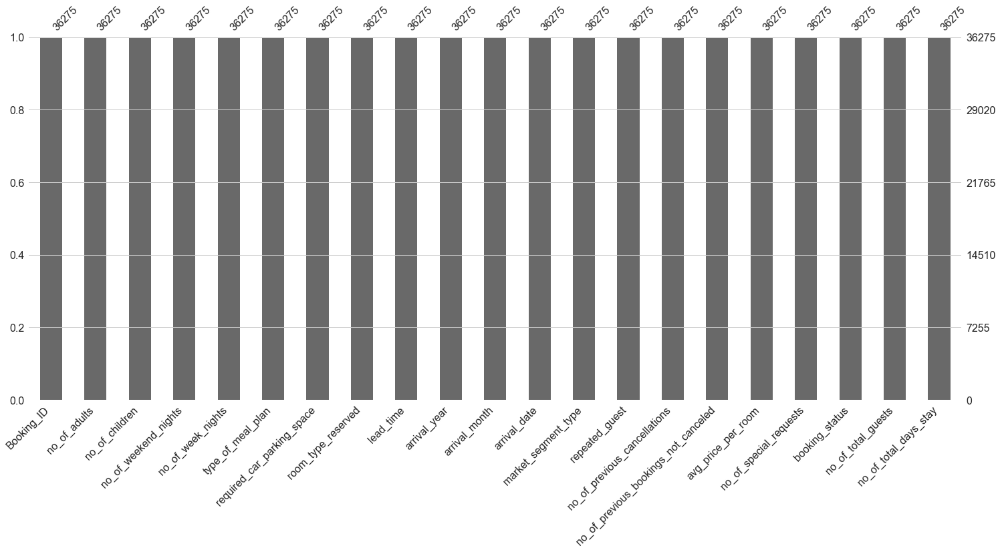

In [15]:
msno.bar(hotel_reservation)
plt.show()

#### 2.2 Functions used to explore each feature

In [16]:
#Function that will return the value count and frequency of each observation within a feature
def value_count_freq(df, feature):
    value_count = df[feature].value_counts()
    value_count_norm = df[feature].value_counts(normalize=True) * 100 #normalizing
    value_count_concat = pd.concat([value_count, value_count_norm], axis=1)
    value_count_concat.columns = ['Count', 'Frequency (%)']
    return value_count_concat

In [17]:
# function to create display general information about the feature
def feature_info(df,feature):
    if feature == 'arrival_year' or feature == 'arrival_month' or feature == 'arrival_date' or feature == 'repeated_guest':
        value_cnt = value_count_freq(df,feature)
        print('Value count:\n{}'.format(value_cnt))    
    else:
        print('Description:\n{}'.format(df[feature].describe()))
        print('*'*50)
        print('Object type:\n{}'.format(df[feature].dtype))
        print('*'*50)
        value_cnt = value_count_freq(df,feature)
        print('Value count:\n{}'.format(value_cnt))

In [18]:
# function to create a pie chart plot
def create_pie_chart(df, feature):
    ratio_size = value_count_freq(df, feature)
    r_list = []
    explode = [0 for i in range(len(ratio_size.index))]
    explode[0] = 0.1
    for i in range(len(ratio_size.index)):
        r_list.append(ratio_size.iloc[i]['Frequency (%)'])
    fig, ax = plt.subplots(figsize=(8,8))
    fig.set_facecolor('white')
    # %1.2f%% display decimals in the pie chart with 2 decimal places
    label = [f'{l} - {s:0.1f}%' for l, s in list(zip(ratio_size.index, r_list))]
    plt.pie(r_list, explode = explode, startangle=90, wedgeprops={'edgecolor' :'black'})
    plt.title('Pie chart of {}'.format(feature))
    plt.legend(loc='best',labels=label)
    plt.axis('equal')
    return plt.show()

In [19]:
# function to create a bar chart plot
def create_bar_plot(df,feature):
    if feature in ['type_of_meal_plan', 'room_type_reserved']:
            fig, ax = plt.subplots(figsize=(6,10))
            sns.barplot(x = value_count_freq(df,feature).index,y = value_count_freq(df,feature).values[:,0])
            ax.set_xticklabels(labels = value_count_freq(df,feature).index,rotation=45,ha='right')
            plt.xlabel('{}'.format(feature))
            plt.ylabel('Count')
            plt.title('{} count'.format(feature))
            return plt.show()
    else:
        fig, ax = plt.subplots(figsize=(6,10))
        sns.barplot(x = value_count_freq(df,feature).index,y = value_count_freq(df,feature).values[:,0])
        plt.xlabel('{}'.format(feature))
        plt.ylabel('Count')
        plt.title('{} count'.format(feature))
        return plt.show()

In [20]:
# function to create a box plot
def create_box_plot(df,feature):
    fig, ax = plt.subplots(figsize=(2,8))
    sns.boxplot(y=df[feature])
    plt.title('{} distribution(Boxplot)'.format(feature))
    return plt.show()

In [21]:
# function to create a histogram plot
def create_hist_plot(df,feature, the_bins=50):

    fig, ax = plt.subplots(figsize=(18,10))
    sns.histplot(df[feature],bins=the_bins,kde=True)
    plt.title('{} distribution'.format(feature))
    return plt.show()

#### 2.3 Univariate Analysis

##### 2.3.1 Number of Adults

In [22]:
feature_info(hr_train, 'no_of_adults')

Description:
count    29020.000000
mean         1.845417
std          0.517203
min          0.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: no_of_adults, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
   Count  Frequency (%)
2  20909      72.050310
1   6148      21.185389
3   1848       6.368022
0    104       0.358374
4     11       0.037905


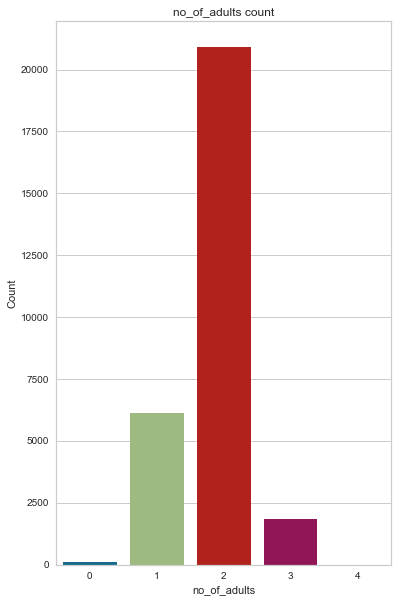

In [23]:
create_bar_plot(hr_train, 'no_of_adults')

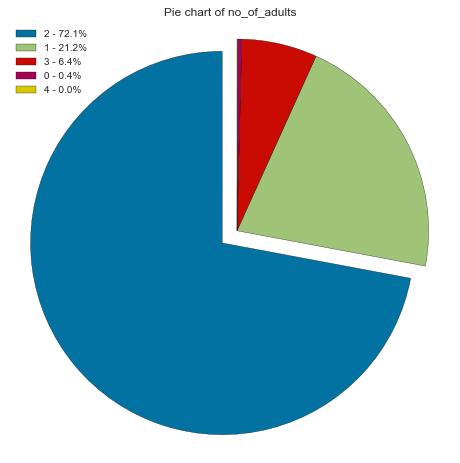

In [24]:
create_pie_chart(hr_train, 'no_of_adults')

Interpretation:
-   Most of the bookings are done with 2 adults staying (72.1% of all bookings)

##### 2.3.2 Number of Children

In [25]:
feature_info(hr_train, 'no_of_children')

Description:
count    29020.000000
mean         0.103032
std          0.400383
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         10.000000
Name: no_of_children, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
    Count  Frequency (%)
0   26906      92.715369
1    1277       4.400414
2     817       2.815300
3      17       0.058580
9       2       0.006892
10      1       0.003446


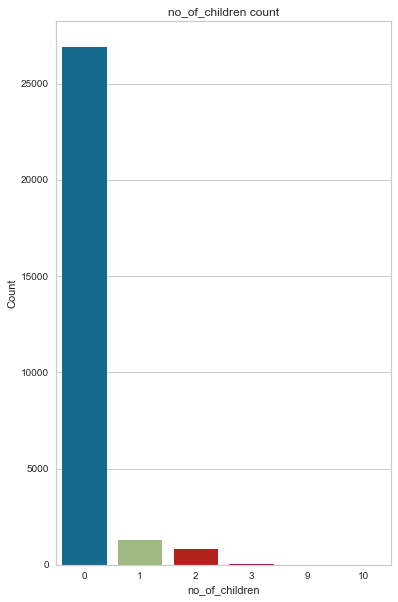

In [26]:
create_bar_plot(hr_train, 'no_of_children')

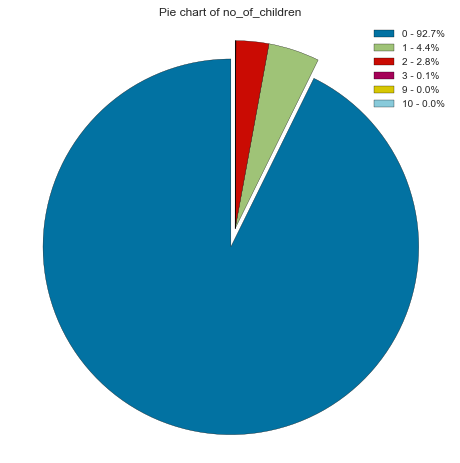

In [27]:
create_pie_chart(hr_train, 'no_of_children')

Interpretation:
-   Most of the bookings do not have any children staying (92.7% of all the bookings)

##### 2.3.3 Total Number of Guests (Adult + Children)

In [28]:
feature_info(hr_train, 'no_of_total_guests')

Description:
count    29020.000000
mean         1.948449
std          0.648311
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max         12.000000
Name: no_of_total_guests, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
    Count  Frequency (%)
2   19203      66.171606
1    6033      20.789111
3    3066      10.565127
4     701       2.415575
5      14       0.048243
10      1       0.003446
11      1       0.003446
12      1       0.003446


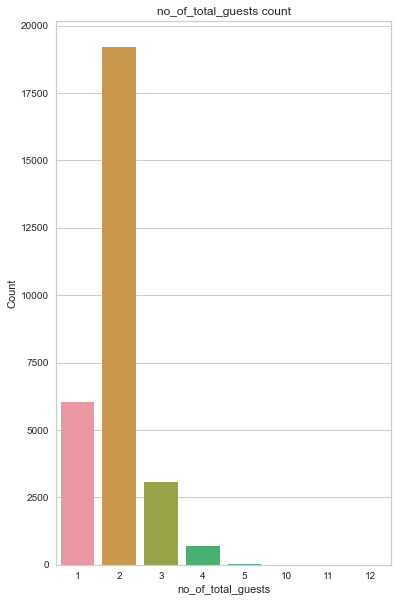

In [29]:
create_bar_plot(hr_train, 'no_of_total_guests')

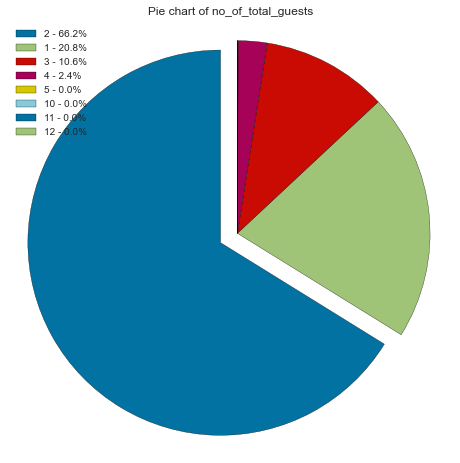

In [30]:
create_pie_chart(hr_train, 'no_of_total_guests')

Interpretation:
-   As expected, since most bookings have 2 adults and no children, most of the bookings have a total of 2 guests staying (66.2% of entire data)

##### 2.3.4 Number of Total Days staying

In [31]:
feature_info(hr_train, 'no_of_total_days_stay')

Description:
count    29020.000000
mean         3.014438
std          1.794510
min          0.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         24.000000
Name: no_of_total_days_stay, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
    Count  Frequency (%)
3    8056      27.760165
2    6811      23.470021
1    5290      18.228808
4    4681      16.130255
5    2054       7.077877
6     808       2.784287
7     805       2.773949
8     138       0.475534
10     85       0.292901
9      85       0.292901
0      54       0.186079
15     30       0.103377
11     29       0.099931
14     22       0.075810
12     20       0.068918
13     17       0.058580
20      9       0.031013
16      6       0.020675
19      6       0.020675
17      5       0.017229
21      3       0.010338
22      2       0.006892
18      2       0.006892
23      1       0.003446
24      

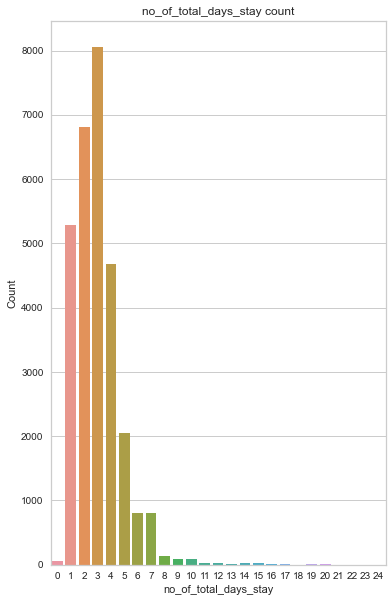

In [32]:
create_bar_plot(hr_train, 'no_of_total_days_stay')

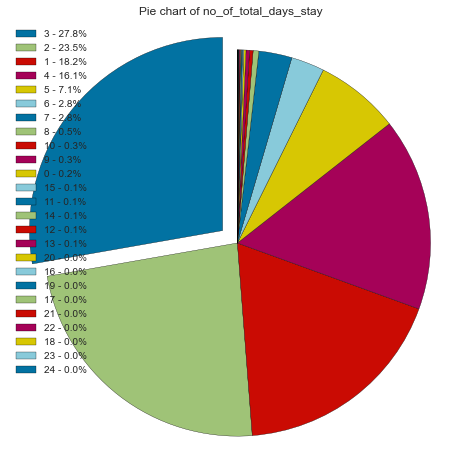

In [33]:
create_pie_chart(hr_train, 'no_of_total_days_stay')

Interpretation:
-   Most of bookings (27.8%) are for 3 day stays followed closely by 2 day stays (23.5%)

##### 2.3.5 Preferred Meal Plan

In [34]:
feature_info(hr_train, 'type_of_meal_plan')

Description:
count           29020
unique              4
top       Meal Plan 1
freq            22263
Name: type_of_meal_plan, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
              Count  Frequency (%)
Meal Plan 1   22263      76.716058
Not Selected   4111      14.166092
Meal Plan 2    2642       9.104066
Meal Plan 3       4       0.013784


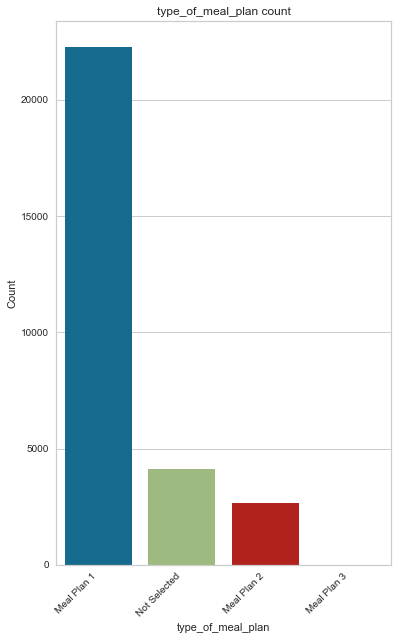

In [35]:
create_bar_plot(hr_train, 'type_of_meal_plan')

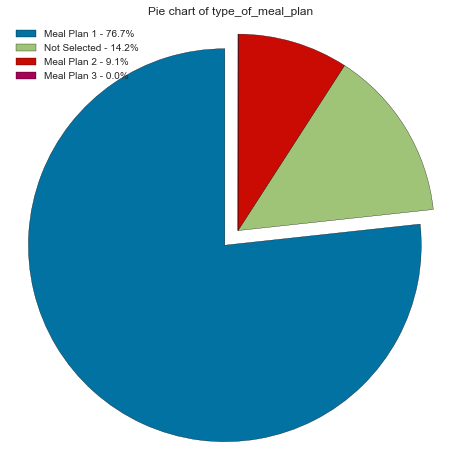

In [36]:
create_pie_chart(hr_train, 'type_of_meal_plan')

Interpretation:
-   Most of the bookings (76.7%) prefer Meal Plan 1

##### 2.3.6 Preferrence of Room Type

In [37]:
feature_info(hr_train, 'room_type_reserved')

Description:
count           29020
unique              7
top       Room_Type 1
freq            22533
Name: room_type_reserved, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
             Count  Frequency (%)
Room_Type 1  22533      77.646451
Room_Type 4   4869      16.778084
Room_Type 6    746       2.570641
Room_Type 2    550       1.895245
Room_Type 5    202       0.696072
Room_Type 7    115       0.396278
Room_Type 3      5       0.017229


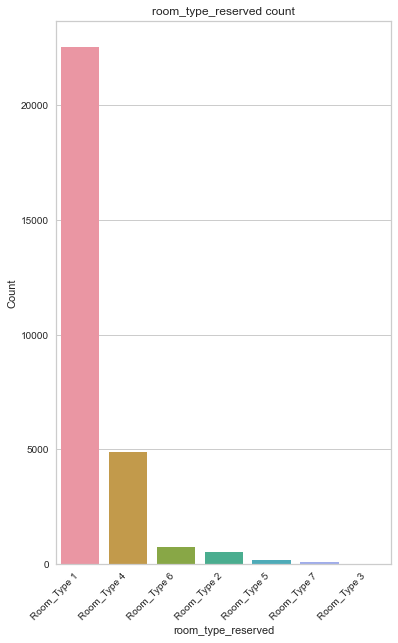

In [38]:
create_bar_plot(hr_train, 'room_type_reserved')

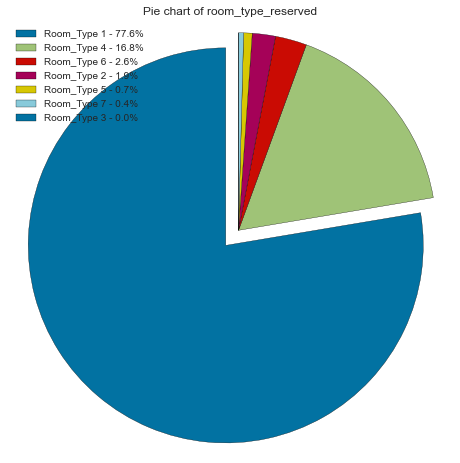

In [39]:
create_pie_chart(hr_train, 'room_type_reserved')

Interpretation:
-   Most of the bookings prefer Room Type 1

##### 2.3.7 Required Car Parking Space

In [40]:
feature_info(hr_train, 'required_car_parking_space')

Description:
count    29020.000000
mean         0.031496
std          0.174656
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: required_car_parking_space, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
   Count  Frequency (%)
0  28106      96.850448
1    914       3.149552


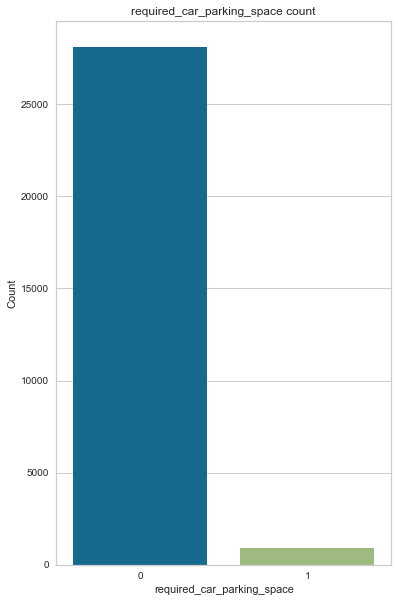

In [41]:
create_bar_plot(hr_train, 'required_car_parking_space')

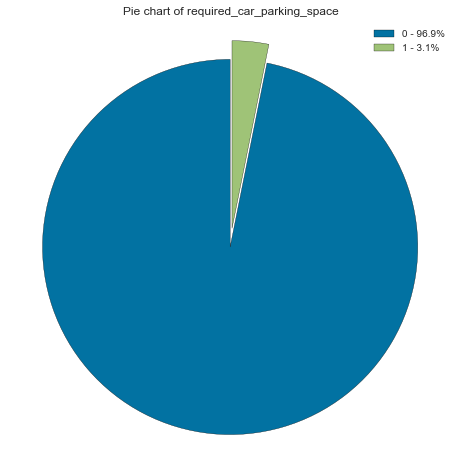

In [42]:
create_pie_chart(hr_train, 'required_car_parking_space')

Interpretation:
-   Most of the bookings prefer no required parking spot

##### 2.3.8 Lead Time to Booking

In [43]:
feature_info(hr_train, 'lead_time')

Description:
count    29020.000000
mean        85.388732
std         86.082817
min          0.000000
25%         17.000000
50%         57.000000
75%        127.000000
max        443.000000
Name: lead_time, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
     Count  Frequency (%)
0     1060       3.652653
1      868       2.991041
4      504       1.736733
3      502       1.729841
2      497       1.712612
..     ...            ...
300      1       0.003446
325      1       0.003446
328      1       0.003446
341      1       0.003446
318      1       0.003446

[348 rows x 2 columns]


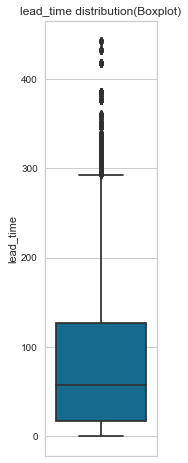

In [44]:
create_box_plot(hr_train, 'lead_time')

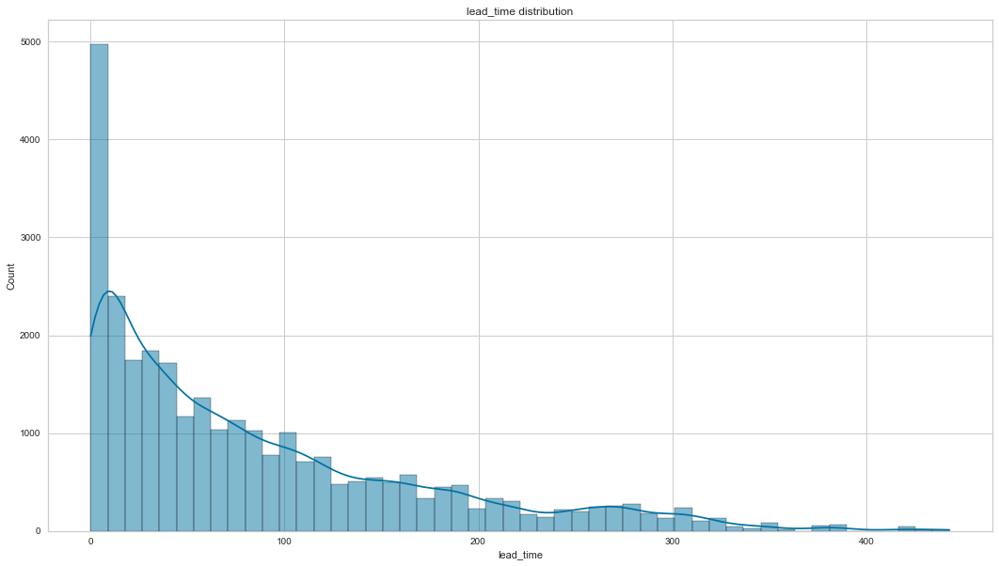

In [45]:
create_hist_plot(hr_train, 'lead_time')

Interpretation:
-   Most of the bookings are done with 0 to 60 days of lead time. 
-   Lead Time is highly postitvely skewed with some booking 400+ daya before the date of arrival

##### 2.3.9 Arrival Year

In [46]:
feature_info(hr_train, 'arrival_year')

Value count:
      Count  Frequency (%)
2018  23818      82.074431
2017   5202      17.925569


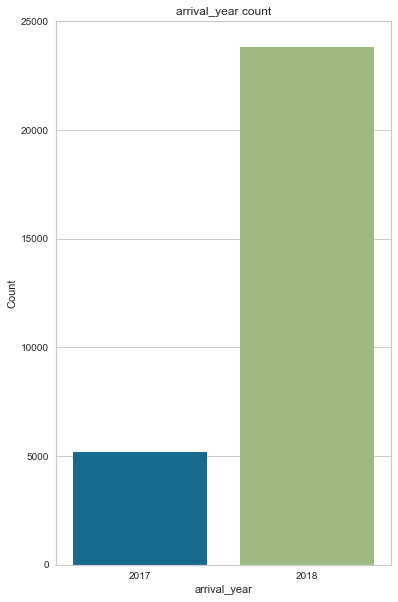

In [47]:
create_bar_plot(hr_train, 'arrival_year')

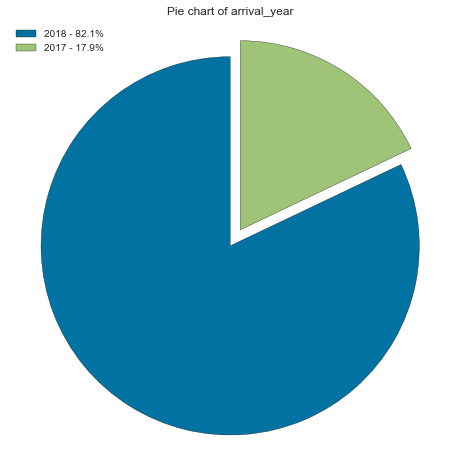

In [48]:
create_pie_chart(hr_train, 'arrival_year')

Interpretation:
-   82.1% of the booking were made in the year 2018

##### 2.3.10 Arrival Month

In [49]:
feature_info(hr_train, 'arrival_month')

Value count:
    Count  Frequency (%)
10   4241      14.614059
9    3695      12.732598
8    3049      10.506547
6    2553       8.797381
12   2408       8.297726
11   2400       8.270159
7    2337       8.053067
4    2183       7.522398
5    2081       7.170917
3    1898       6.540317
2    1360       4.686423
1     815       2.808408


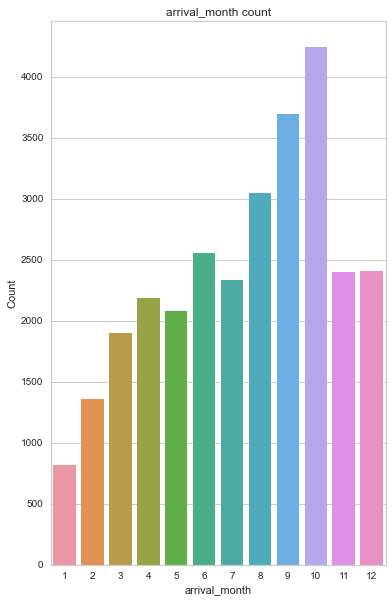

In [50]:
create_bar_plot(hr_train, 'arrival_month')

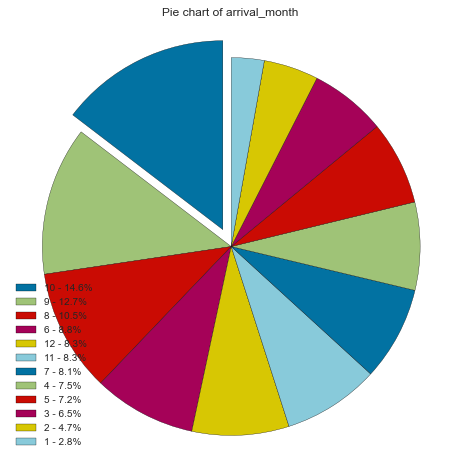

In [51]:
create_pie_chart(hr_train, 'arrival_month')

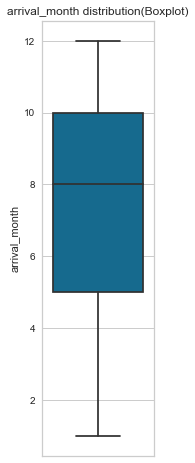

In [52]:
create_box_plot(hr_train, 'arrival_month')

Interpretation:
-   Most of the bookings prefer to stay in month of October followed by Spetember
-   The distribution is slightly negatively skewed as expected

##### 2.3.11 Preferred way to book rooms 

In [53]:
feature_info(hr_train, 'market_segment_type')

Description:
count      29020
unique         5
top       Online
freq       18605
Name: market_segment_type, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
               Count  Frequency (%)
Online         18605      64.110958
Offline         8386      28.897312
Corporate       1628       5.609924
Complementary    303       1.044108
Aviation          98       0.337698


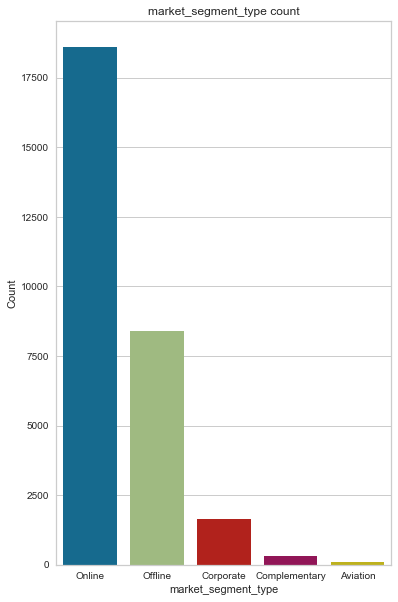

In [54]:
create_bar_plot(hr_train, 'market_segment_type')

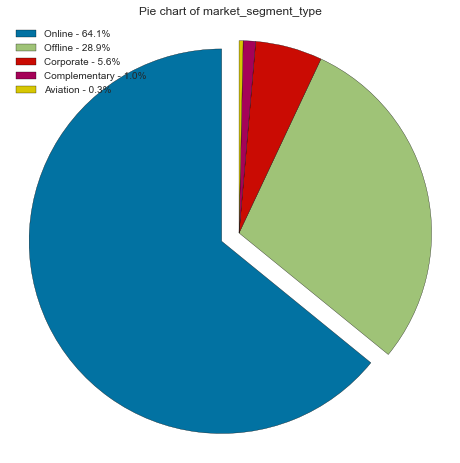

In [55]:
create_pie_chart(hr_train, 'market_segment_type')

Interpretation:
-   Most of the bookings (64.1%) are made via Online websites. 

##### 2.3.12 Repeated Guests

In [56]:
feature_info(hr_train, 'repeated_guest')

Value count:
   Count  Frequency (%)
0  28256      97.367333
1    764       2.632667


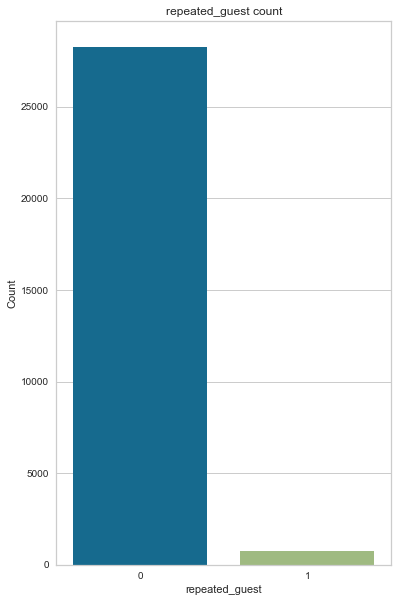

In [57]:
create_bar_plot(hr_train, 'repeated_guest')

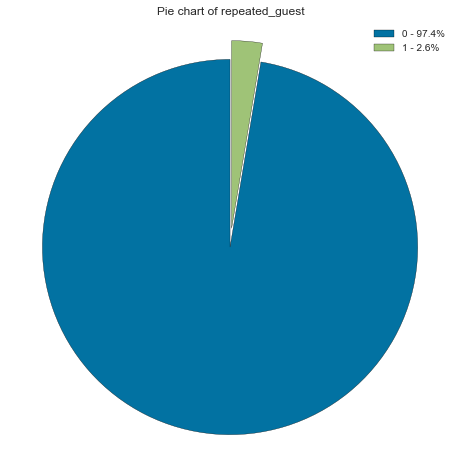

In [58]:
create_pie_chart(hr_train, 'repeated_guest')

Interpretation:
-   Majority of the bookings are done by new guests (97.4%)

##### 2.3.13 Number of Previous Cancellations

In [59]:
feature_info(hr_train, 'no_of_previous_cancellations')

Description:
count    29020.000000
mean         0.024190
std          0.370945
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         13.000000
Name: no_of_previous_cancellations, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
    Count  Frequency (%)
0   28740      99.035148
1     160       0.551344
3      40       0.137836
2      39       0.134390
11     20       0.068918
5      11       0.037905
4       6       0.020675
13      3       0.010338
6       1       0.003446


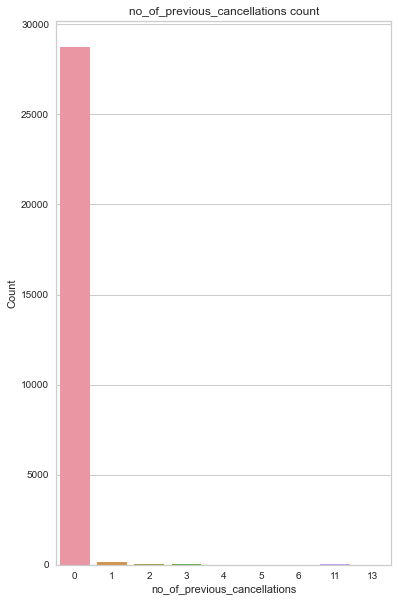

In [60]:
create_bar_plot(hr_train, 'no_of_previous_cancellations')

Interpretation:
-   99% of the customers had no previous booking cancellations

##### 2.3.14 Number of Special Requests

In [61]:
feature_info(hr_train, 'no_of_special_requests')

Description:
count    29020.000000
mean         0.620710
std          0.785832
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          5.000000
Name: no_of_special_requests, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
   Count  Frequency (%)
0  15790      54.410751
1   9131      31.464507
2   3486      12.012405
3    548       1.888353
4     59       0.203308
5      6       0.020675


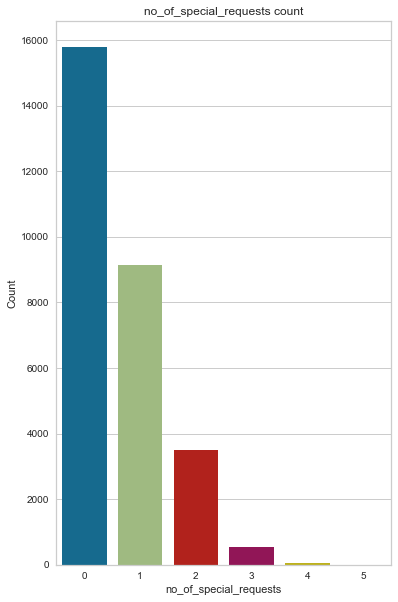

In [62]:
create_bar_plot(hr_train, 'no_of_special_requests')

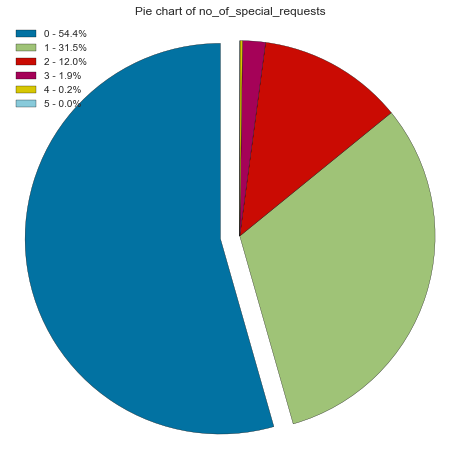

In [63]:
create_pie_chart(hr_train, 'no_of_special_requests')

Interpretation:
-   Most of the bookings make no special requests (54.4%). Around 31% make 1 special requests

##### 2.3.15 Average Price of the Room

In [64]:
feature_info(hr_train, 'avg_price_per_room')

Description:
count    29020.000000
mean       103.358445
std         34.941523
min          0.000000
25%         80.300000
50%         99.450000
75%        120.000000
max        540.000000
Name: avg_price_per_room, dtype: float64
**************************************************
Object type:
float64
**************************************************
Value count:
        Count  Frequency (%)
65.00     671       2.312198
75.00     657       2.263956
90.00     568       1.957271
95.00     545       1.878015
115.00    526       1.812543
...       ...            ...
62.57       1       0.003446
164.20      1       0.003446
138.71      1       0.003446
231.50      1       0.003446
135.01      1       0.003446

[3508 rows x 2 columns]


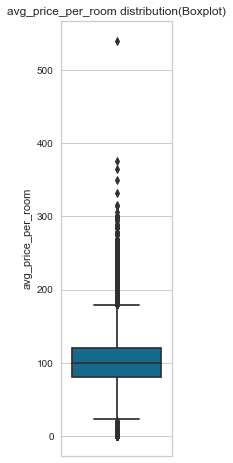

In [65]:
create_box_plot(hr_train, 'avg_price_per_room')

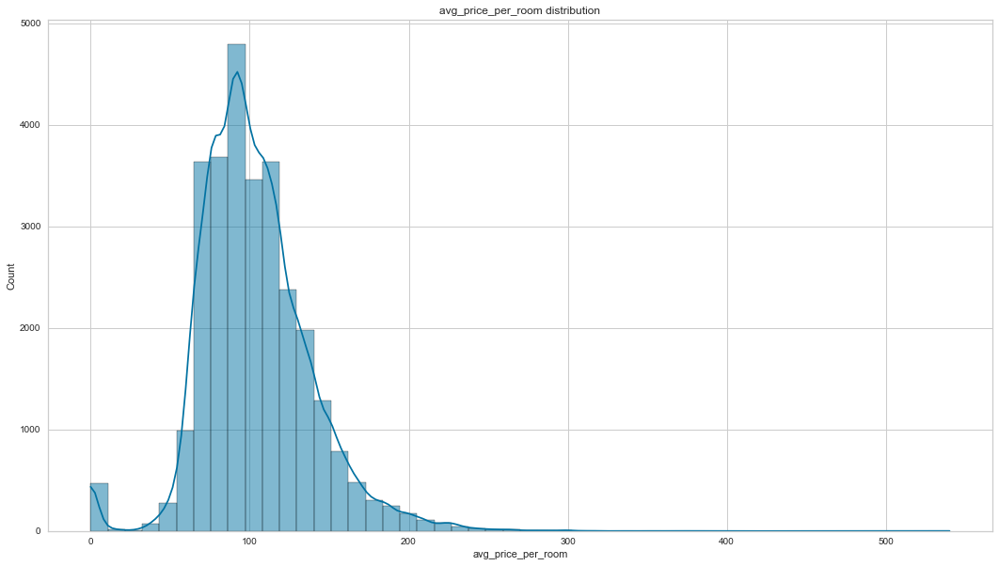

In [66]:
create_hist_plot(hr_train, 'avg_price_per_room')

Interpretation:
-   The Average Price of Room is highly positively skewed.
-   While the average price of bookings is around 100, there are a few outlier and an extreme outlier of 540

##### 2.3.16 Booking Status (Target Variable)

In [67]:
feature_info(hr_train, 'booking_status')

Description:
count            29020
unique               2
top       Not_Canceled
freq             19481
Name: booking_status, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
              Count  Frequency (%)
Not_Canceled  19481      67.129566
Canceled       9539      32.870434


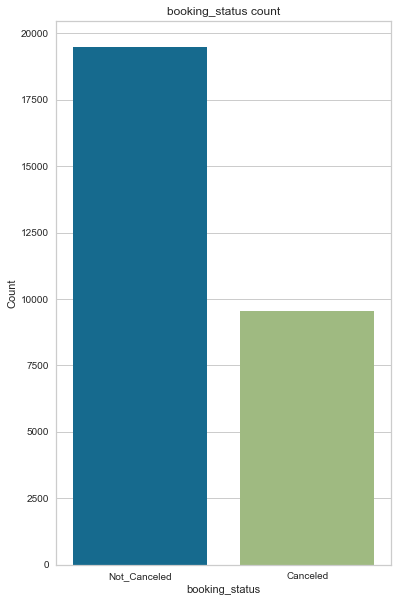

In [68]:
create_bar_plot(hr_train, 'booking_status')

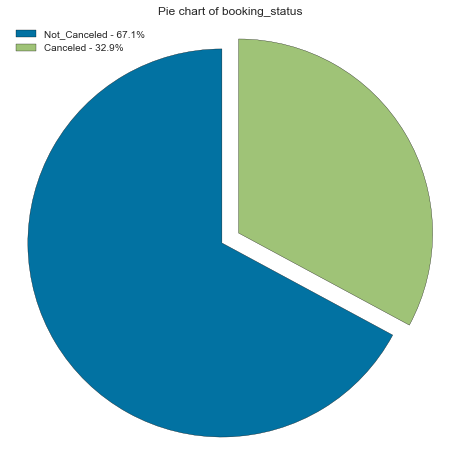

In [69]:
create_pie_chart(hr_train, 'booking_status')

Interpretation:
-   Most of the bookings are not Cancelled

#### 2.4 Bivariate Analysis

##### 2.4.1 Numerical vs numerical features (Correlation & scatter plots)

##### 2.4.1.1 Scatter Plots with Regression line

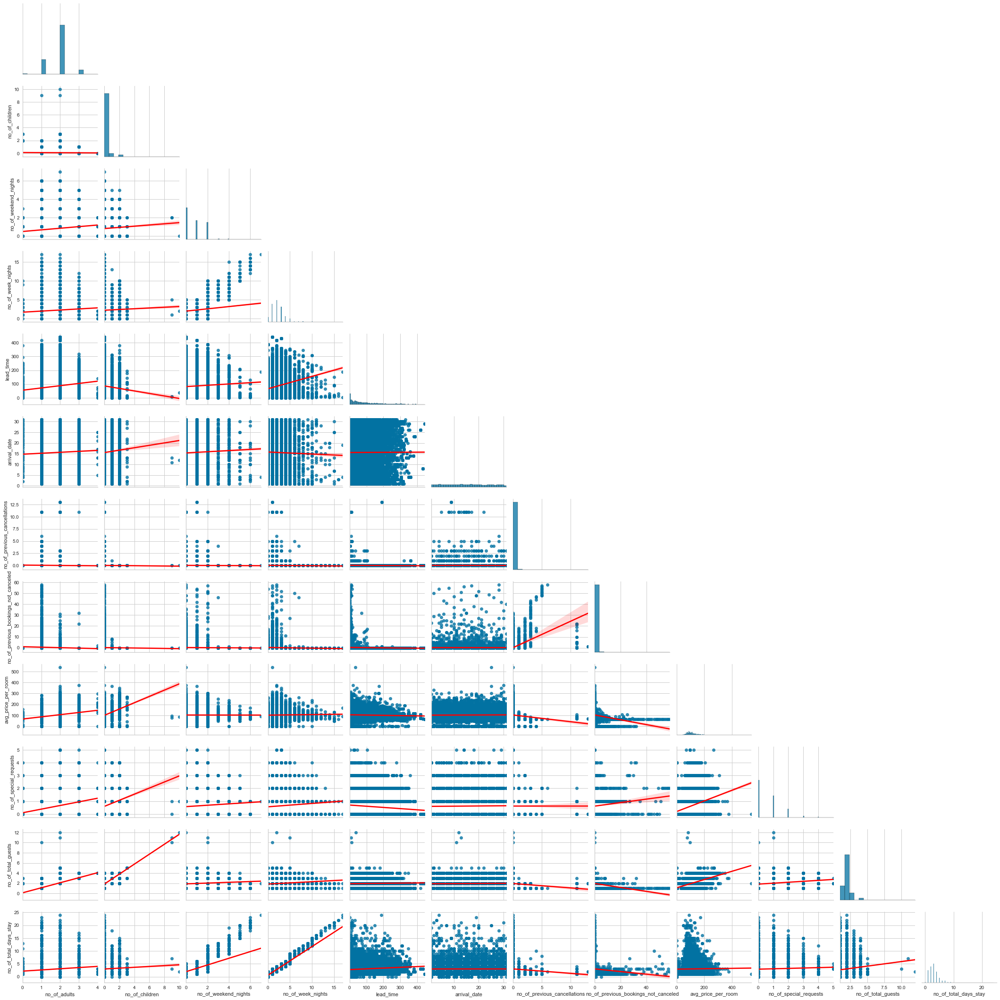

In [70]:
sns.pairplot(hr_train.drop(['type_of_meal_plan','required_car_parking_space', 'room_type_reserved', 'arrival_year', 'arrival_month', 'market_segment_type', 'repeated_guest', 'booking_status'],axis=1),corner=True, plot_kws={'line_kws':{'color':'red'}}, kind = 'reg')
plt.show()

Interpretation
- As expected, there is a positive correlation between number of childree, number of adults with total number of guests as latter is the sum of former two.
- There is also a positive correlation between number of special requests and number of children 
- Number of Week nights and weekend nights also show a positive correlation with total number of days stayed (as expected)
- The average price per room shows positive correlation with total number of guests staying as price increases with number of guests
- The average price of room also increase with the increase in number of special requests
- There is a *negative correlation* between number of childrena and lead time to a booking

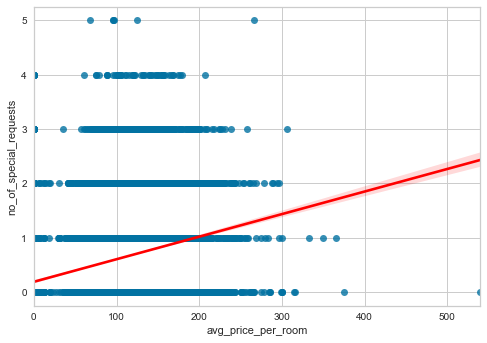

In [71]:
sns.regplot(y='no_of_special_requests',x='avg_price_per_room',data=hr_train,line_kws={'color': 'red'})
plt.show()

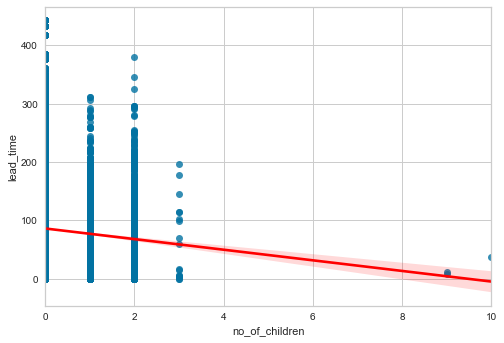

In [72]:
sns.regplot(y='lead_time',x='no_of_children',data=hr_train,line_kws={'color': 'red'})
plt.show()

##### 2.4.1.2 Correlation Analysis

In [73]:
booking_status_int = hr_train.booking_status.map(dict(Canceled=1, Not_Canceled=0))

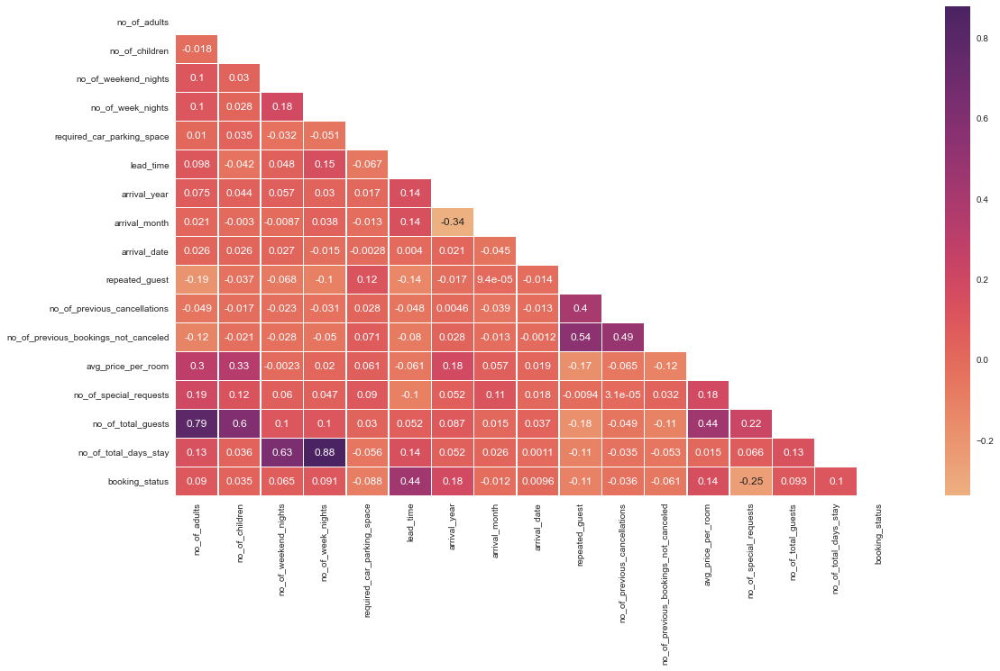

In [74]:
# correlation analysis with heatmap, after dropping target feature as int
hr_train_corr = pd.concat([hr_train.drop(['booking_status'], axis=1), booking_status_int],axis=1).corr()
# Get the lower triangle of the correlation matrix
# Generate a mask for the upper triangle
mask = np.zeros_like(hr_train_corr, dtype='bool')
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(18,10))
# seaborn heatmap
sns.heatmap(hr_train_corr, annot=True, cmap='flare',mask=mask, linewidths=.5)
# plot the heatmap
plt.show()

Interpretation:
- lead time is slightly correlated with the target variable (booking status)
- We can see a negative correlation between number of special requests and target variable
- As previously discussed, total guests staying is highly correlated with number of adults and number of children.
- Also total number of days staying is highly correlated with number of weekdays and weekends (previously discussed)
- There is also a slight correlation between repeated guests and number of previous cancellations. 


#### 2.4.2 Numberical v/s Categorical features (ANOVA)

##### 2.4.2.1 Average Room price v/s rest of categorical features (Using Violin plots)

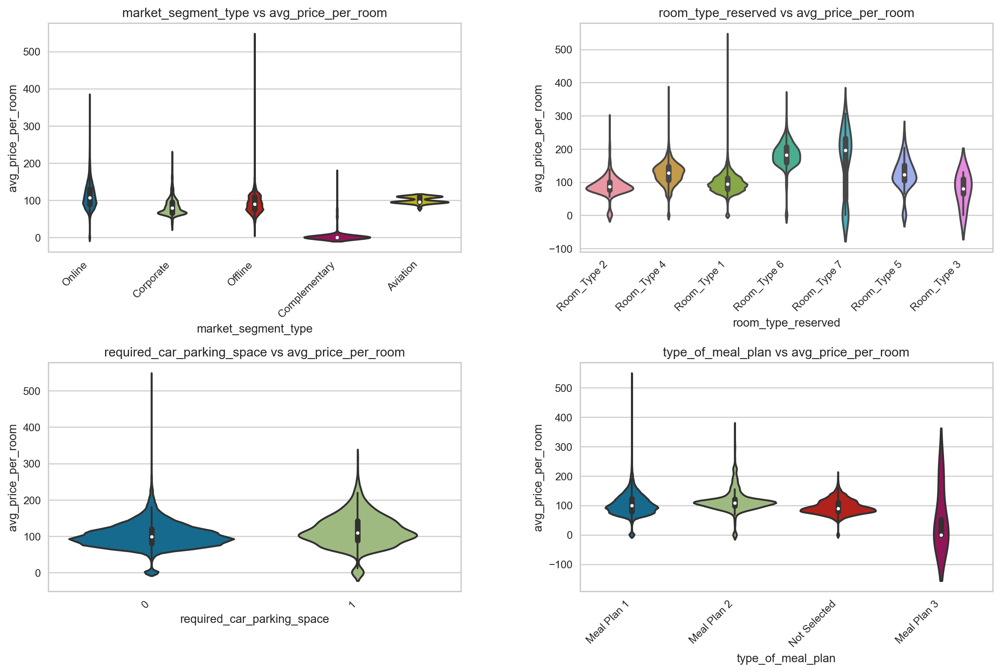

In [75]:
fig, axes = plt.subplots(2,2,figsize=(15,10),dpi=180)
fig.tight_layout(pad=7.0)
cat_features = ['market_segment_type', 'room_type_reserved', 'required_car_parking_space', 'type_of_meal_plan']
for cat_ft_count, ax in enumerate(axes):
    for row_count in range(2):
        for feat_count in range(2):
            sns.violinplot(ax=axes[row_count,feat_count],x=hr_train[cat_features[cat_ft_count]],y=hr_train['avg_price_per_room'])
            axes[row_count,feat_count].set_title(cat_features[cat_ft_count] + " vs avg_price_per_room")
            plt.sca(axes[row_count,feat_count])
            plt.xticks(rotation=45,ha='right')
            plt.ylabel('avg_price_per_room')
            cat_ft_count += 1
    break

<AxesSubplot:xlabel='repeated_guest', ylabel='avg_price_per_room'>

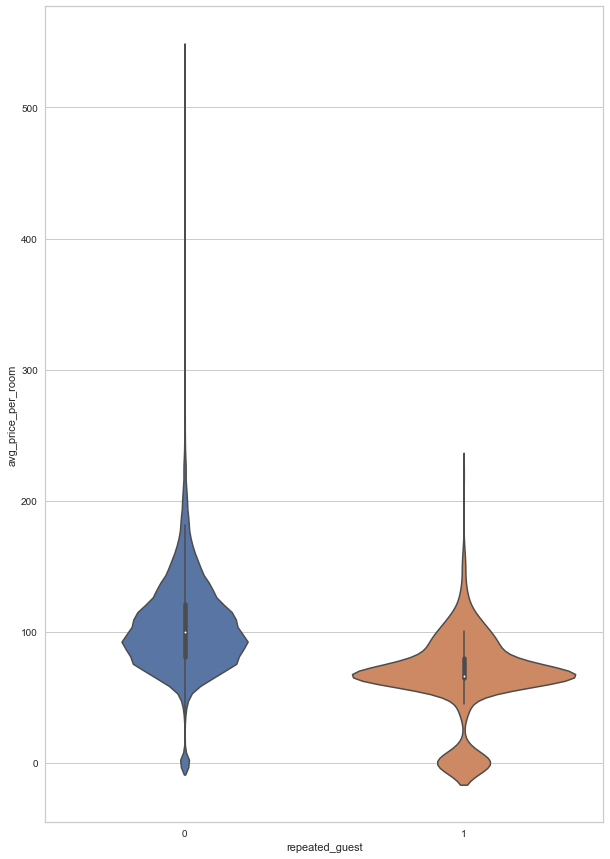

In [76]:
fig, ax = plt.subplots(figsize=(10,15))
sns.set(style="darkgrid")
sns.violinplot(x= hr_train['repeated_guest'], y= hr_train['avg_price_per_room'])

Interpretation:
1. The average price of a room differs for each market segment
    - While the avg. prices remains around 100 for online bookings, it falls below average for corporate bookings (expected discounts)
    - As exprected the avg. price of rooms for complementary rooms is around 0
    - Offline bookings seem to have lower average price then online booking with a few extremem outliers

2. The average price of the room increases if the guests select Room Type 4, 6 or 7
3. Required car parking spot does not affect the average price of the room that much 
4. Not selecting meal plan or selecting meal plan 1 reduce the avg. price to below 100 slightly.
5. Repeated guests seem to get better average price per room when compared to new customers

##### 2.4.2.2 Average Room price v/s Arrival Date of booking

<AxesSubplot:xlabel='arrival_date', ylabel='avg_price_per_room'>

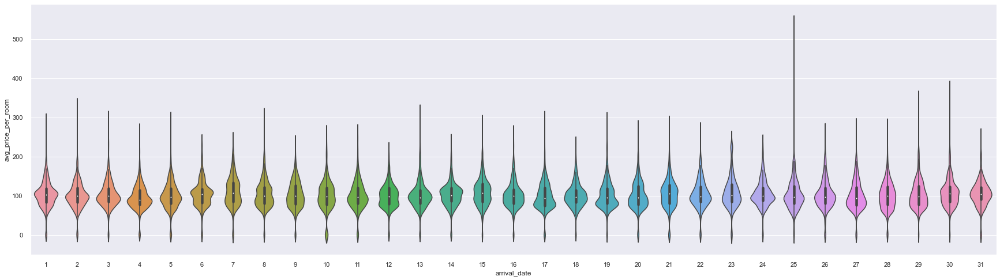

In [77]:
fig, ax = plt.subplots(figsize=(30,8))
sns.set(style="darkgrid")
sns.violinplot(x= hr_train['arrival_date'], y= hr_train['avg_price_per_room'])


Interpretation
- The average price of the room seems to be high for starting and last couple of days of the month. 
- The prices dip in the 2nd and 3rd week with exceptions for 14th and 15th

##### 2.4.2.2 Average Room price v/s Arrival Month

<AxesSubplot:xlabel='arrival_month', ylabel='avg_price_per_room'>

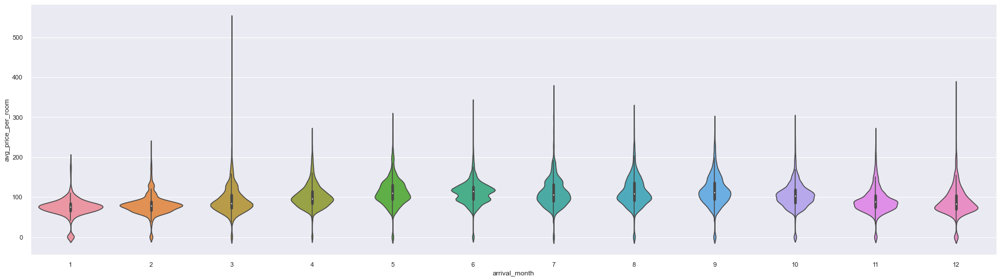

In [78]:
fig, ax = plt.subplots(figsize=(30,8))
sns.set(style="darkgrid")
sns.violinplot(x= hr_train['arrival_month'], y= hr_train['avg_price_per_room'])

Interpretation
- The average prices for January, February, March, November, December are lower than the prices for other months. 
- The month of June has higher prices when compared to others, the average being 120.

##### 2.4.2.2 Average Room price v/s Arrival Year

<AxesSubplot:xlabel='arrival_year', ylabel='avg_price_per_room'>

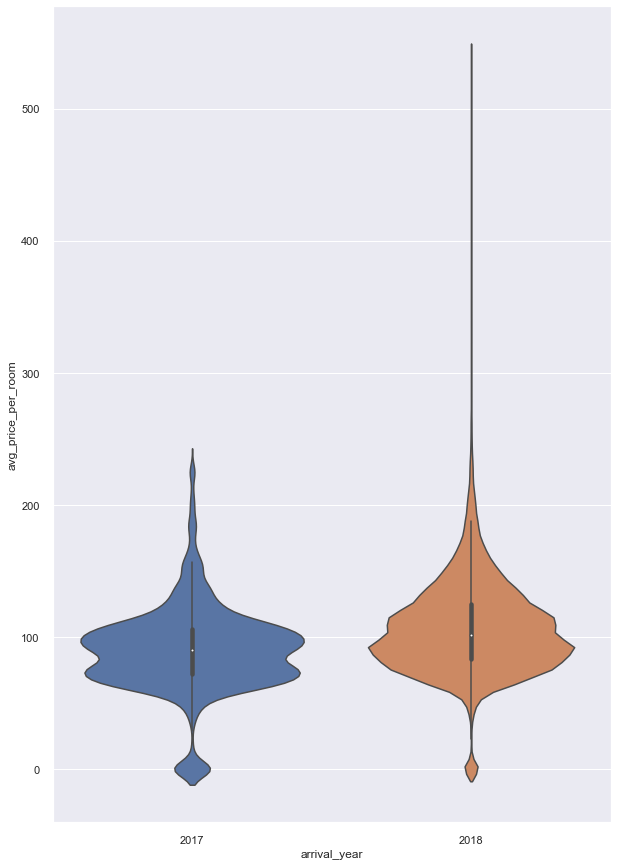

In [79]:
fig, ax = plt.subplots(figsize=(10,15))
sns.set(style="darkgrid")
sns.violinplot(x= hr_train['arrival_year'], y= hr_train['avg_price_per_room'])

Interpretation
- the average room prices are lower in year 2018 as compared to 2017

#### 2.4 Categorical vs categorical features (Chi-square test)

- Null hypothesis: the feature's categories have no effect on the target variable. 
- Alternate hypothesis: one(or more) of the feature categories has a significant effect on the target variable.

In [80]:
def chi_func(feature):
    # selection row with Canceled Booking Status
    booking_status_ft = hr_train[hr_train['booking_status'] == 'Canceled'][feature]
    booking_status_ft_ct = pd.crosstab(index=booking_status_ft, columns=['Count']).rename_axis(None, axis=1)
    # drop the index feature name
    booking_status_ft_ct.index.name = None
    # observe values
    obs = booking_status_ft_ct
    print('Observed values:\n')
    print(obs)
    print('\n')
    # expected values
    print(obs.index)
    exp = pd.DataFrame([obs['Count'].sum()/len(obs)] * len(obs.index),columns=['Count'], index=obs.index)
    print('Expected values:\n')
    print(exp)
    print('\n')
    # chi-square test
    chi_squared_stat = (((obs-exp)**2)/exp).sum()
    print('Chi-square:\n')
    print(chi_squared_stat[0])
    print('\n')
    #critical value
    crit = stats.chi2.ppf(q = 0.95, df = len(obs) - 1)
    print('Critical value:\n')
    print(crit)
    print('\n')
    # p-value
    p_value = 1 - stats.chi2.cdf(x = chi_squared_stat, df = len(obs) - 1)
    print('P-value:\n')
    print(p_value)
    print('\n')
    if chi_squared_stat[0] >= crit:
        print('Reject the null hypothesis')
    elif chi_squared_stat[0] <= crit:
        print('Fail to reject the null hypothesis')

In [81]:
cat_ft = ['type_of_meal_plan', 'required_car_parking_space', 'room_type_reserved', 'market_segment_type', 'repeated_guest']
for ft in cat_ft:
    print('\n\n**** {} ****\n'.format(ft))
    chi_func(ft)



**** type_of_meal_plan ****

Observed values:

              Count
Meal Plan 1    6966
Meal Plan 2    1199
Meal Plan 3       1
Not Selected   1373


Index(['Meal Plan 1', 'Meal Plan 2', 'Meal Plan 3', 'Not Selected'], dtype='object')
Expected values:

                Count
Meal Plan 1   2384.75
Meal Plan 2   2384.75
Meal Plan 3   2384.75
Not Selected  2384.75


Chi-square:

12202.434951252751


Critical value:

7.814727903251179


P-value:

[0.]


Reject the null hypothesis


**** required_car_parking_space ****

Observed values:

   Count
0   9447
1     92


Int64Index([0, 1], dtype='int64')
Expected values:

    Count
0  4769.5
1  4769.5


Chi-square:

9174.549218995702


Critical value:

3.841458820694124


P-value:

[0.]


Reject the null hypothesis


**** room_type_reserved ****

Observed values:

             Count
Room_Type 1   7301
Room_Type 2    183
Room_Type 3      1
Room_Type 4   1661
Room_Type 5     53
Room_Type 6    312
Room_Type 7     28


Index(['Room_Type 1', 'Room_Ty

#### 2.5 Business Analysis from EDA

- **Most of the bookings are done by 2 adults in the months of Asugust, September and October, requesting no parking spot and choosing Room Type 1 and Meal Plan 1. Most of them also do not make any special requests or have any previous cancellations**
- **Online is the preferred way of making a booking in Hotel INN**
- **Repeated Guests do not tend to cancel their bookings or have any previous cancellations. They also seem to get lower average price per room as compared to new customer**

### 3. Prepare Data

#### 3.1 Transformation to be done on each feature



1. Booking_ID:
    - Drop
2. no_of_adults:                          
    - Drop
3. no_of_children:                          
    - Drop
3. no_of_weekend_nights:                    
    - Drop
4. no_of_week_nights:                       
    - Drop
5. type_of_meal_plan:                      
    - One Hot Encoding
6. room_type_reserved:                     
    - One Hot Encoding
7. lead_time:                               
    - Fix Skewness
    - Min-Max Scaling
8. market_segment_type:                    
    - One Hot Encoding
9. avg_price_per_room:                        
    - Fix Skewness
    - Min-Max Scaling
    - Outlier Removal
10. booking_status:                        
    - Change to Numerical
    - balance with SMOTE 

#### 3.2 Data Cleaning

#### 3.2.1 Outlier Removel

In [82]:
class OutlierRemover(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_outliers = ['avg_price_per_room']):
        self.feat_with_outliers = feat_with_outliers
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_outliers).issubset(df.columns)):
            # 25% quantile
            Q1 = df[self.feat_with_outliers].quantile(.25)
            # 75% quantile
            Q3 = df[self.feat_with_outliers].quantile(.75)
            IQR = Q3 - Q1
            # keep the data within 3 IQR
            df = df[~((df[self.feat_with_outliers] < (Q1 - 3 * IQR)) |(df[self.feat_with_outliers] > (Q3 + 3 * IQR))).any(axis=1)]
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

#### 3.3 Feature Selection Data Cleaning

#### 3.3.1 Drop features

In [83]:
class DropFeatures(BaseEstimator,TransformerMixin):
    def __init__(self,feature_to_drop = ['Booking_ID','no_of_adults','no_of_children','no_of_week_nights','no_of_weekend_nights']):
        self.feature_to_drop = feature_to_drop
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feature_to_drop).issubset(df.columns)):
            df.drop(self.feature_to_drop,axis=1,inplace=True)
            return df
        else:
            print("One or more features are not in the dataframe")
            return df



Why drop the selected features?

- Booking ID does not affect the prediction in any way. 
- no_of_adult and no_of_children are removed since we added new feature of total_no_of_guests. This will also remove multi-collinearity. 
- Similary, no_of_weekend_nights and no_of_week_nights is also removed since we added total_no_of_days

#### 3.4 Feature Engineering

#### 3.4.1 Skewness Handling

In [84]:
class SkewnessHandler(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_skewness=['lead_time','avg_price_per_room']):
        self.feat_with_skewness = feat_with_skewness
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_skewness).issubset(df.columns)):
            # Handle skewness with cubic root transformation
            df[self.feat_with_skewness] = np.cbrt(df[self.feat_with_skewness])
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

#### 3.4.2 Changing Target Variable to 0 and 1

- Canceled - 1
- Not Canceled - 0

In [85]:
class BinningToOneZero(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_num_enc=['booking_status']):
        self.feat_with_num_enc = feat_with_num_enc
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_num_enc).issubset(df.columns)):
            # Change 0 to N and 1 to Y for all the features in feat_with_num_enc
            for ft in self.feat_with_num_enc:
                df[ft] = df[ft].map({'Canceled': 1,'Not_Canceled':0})
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

#### 3.4.3 One Hot Encoding

In [86]:


class OneHotWithFeatNames(BaseEstimator,TransformerMixin):
    def __init__(self,one_hot_enc_ft = ['type_of_meal_plan', 'market_segment_type', 'room_type_reserved']):
        self.one_hot_enc_ft = one_hot_enc_ft
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.one_hot_enc_ft).issubset(df.columns)):
            # function to one hot encode the features in one_hot_enc_ft
            def one_hot_enc(df,one_hot_enc_ft):
                one_hot_enc = OneHotEncoder()
                one_hot_enc.fit(df[one_hot_enc_ft])
                # get the result of the one hot encoding columns names
                feat_names_one_hot_enc = one_hot_enc.get_feature_names_out(one_hot_enc_ft)
                # change the array of the one hot encoding to a dataframe with the column names
                df = pd.DataFrame(one_hot_enc.transform(df[self.one_hot_enc_ft]).toarray(),columns=feat_names_one_hot_enc,index=df.index)
                return df
            # function to concatenat the one hot encoded features with the rest of features that were not encoded
            def concat_with_rest(df,one_hot_enc_df,one_hot_enc_ft):
                # get the rest of the features
                rest_of_features = [ft for ft in df.columns if ft not in one_hot_enc_ft]
                # concatenate the rest of the features with the one hot encoded features
                df_concat = pd.concat([one_hot_enc_df, df[rest_of_features]],axis=1)
                return df_concat
            # one hot encoded dataframe
            one_hot_enc_df = one_hot_enc(df,self.one_hot_enc_ft)
            # returns the concatenated dataframe
            full_df_one_hot_enc = concat_with_rest(df,one_hot_enc_df,self.one_hot_enc_ft)
            return full_df_one_hot_enc
        else:
            print("One or more features are not in the dataframe")
            return df



#### 3.4.5 Min Max Scaling

In [87]:
class MinMaxWithFeatNames(BaseEstimator,TransformerMixin):
    def __init__(self,min_max_scaler_ft = ['lead_time', 'avg_price_per_room']):
        self.min_max_scaler_ft = min_max_scaler_ft
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.min_max_scaler_ft).issubset(df.columns)):
            min_max_enc = MinMaxScaler()
            df[self.min_max_scaler_ft] = min_max_enc.fit_transform(df[self.min_max_scaler_ft])
            return df
        else:
            print("One or more features are not in the dataframe")
            return df



#### 3.4.6 Oversampling

In [88]:
class Oversample(BaseEstimator,TransformerMixin):
    def __init__(self):
        pass
    def fit(self,df):
        return self
    def transform(self,df):
        if 'booking_status' in df.columns:
            # smote function to oversample the minority class to fix the imbalance data
            oversample = SMOTE(sampling_strategy='minority')
            X_bal, y_bal = oversample.fit_resample(df.loc[:, df.columns != 'booking_status'],df['booking_status'])
            df_bal = pd.concat([pd.DataFrame(X_bal),pd.DataFrame(y_bal)],axis=1)
            return df_bal
        else:
            print("booking_status is not in the dataframe")
            return df



#### 3.5 Data Preprocessing

In [89]:
def full_pipeline(df):
    # Create the pipeline that will call all the class from OutlierRemoval to OversampleSMOTE in one go
    pipeline = Pipeline([
        ('outlier_remover', OutlierRemover()),
        ('feature_dropper', DropFeatures()),
        ('skewness_handler', SkewnessHandler()),
        ('binning_num_to_yn', BinningToOneZero()),
        ('one_hot_with_feat_names', OneHotWithFeatNames()),
        ('min_max_with_feat_names', MinMaxWithFeatNames()),
        ('oversample', Oversample())
    ])
    df_pipe_prep = pipeline.fit_transform(df)
    return df_pipe_prep

In [90]:
pd.options.mode.chained_assignment = None  # Hide the copy warning
hr_train_prep = full_pipeline(hr_train)

In [91]:
hr_train_prep.shape

(38882, 29)

In [92]:
pd.set_option('display.max_columns', None)
hr_train_prep.head()

,type_of_meal_plan_Meal Plan 1,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,market_segment_type_Aviation,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online,room_type_reserved_Room_Type 1,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 3,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,no_of_total_guests,no_of_total_days_stay,booking_status
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0.459573,2018,1,14,0,0,0,0.713330,1,2,3,0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0.429096,2018,5,27,0,0,0,0.862412,0,3,3,1
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.576773,2017,9,9,0,0,0,0.722129,0,1,2,0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.740667,2018,7,13,0,0,0,0.724661,1,2,4,0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.373057,2018,9,11,0,0,0,0.748190,2,2,2,0


In [93]:
X_hr_train_prep, y_hr_train_prep = hr_train_prep.loc[:, hr_train_prep.columns != 'booking_status'], hr_train_prep['booking_status'].astype('int64')

### 4. Models used for prediciton

#### 4.1 Model Training

In [94]:
classifiers = {
    'sgd':SGDClassifier(random_state=42,loss='perceptron'),
    'logistic_regression':LogisticRegression(random_state=42,max_iter=1000),
    'support_vector_machine':SVC(random_state=42,probability=True),
    'decision_tree':DecisionTreeClassifier(random_state=42),
    'random_forest':RandomForestClassifier(random_state=42),
    'gaussian_naive_bayes':GaussianNB(),
    'k_nearest_neighbors':KNeighborsClassifier(),
    'gradient_boosting':GradientBoostingClassifier(random_state=42),
    'linear_discriminant_analysis':LinearDiscriminantAnalysis(),
    'bagging':BaggingClassifier(random_state=42),
    'neural_network':MLPClassifier(random_state=42,max_iter=1000),
    'adaboost':AdaBoostClassifier(random_state=42),
    'extra_trees':ExtraTreesClassifier(random_state=42),
    }

In [95]:
def feat_importance_plot(model_trn, model_name):
    if model_name not in ['sgd','support_vector_machine','gaussian_naive_bayes','k_nearest_neighbors','bagging','neural_network']:
        # change xtick font size
        plt.rcParams['xtick.labelsize'] = 12
        plt.rcParams['ytick.labelsize'] = 12
        # top 10 most predictive features
        top_10_feat = FeatureImportances(model_trn, relative=False, topn=10)
        # top 10 least predictive features
        bottom_10_feat = FeatureImportances(model_trn, relative=False, topn=-10)
        #change the figure size
        plt.figure(figsize=(10, 4))
        #change x label font size
        plt.xlabel('xlabel', fontsize=14)
        # Fit to get the feature importances
        top_10_feat.fit(X_hr_train_prep, y_hr_train_prep)
        # show the plot
        top_10_feat.show()
        print('\n')
        plt.figure(figsize=(10, 4))
        plt.xlabel('xlabel', fontsize=14)
        # Fit to get the feature importances
        bottom_10_feat.fit(X_hr_train_prep, y_hr_train_prep)
        # show the plot
        bottom_10_feat.show()
        print('\n')
    else:
        print('No feature importance for {0}'.format(model_name))
        print('\n')

In [96]:
def y_prediction_func(model_trn,model_name,final_model=False):
    if final_model == False:
        # check if y_train_copy_pred exists, if not create it
        y_hr_train_pred_path = Path('saved_models/{0}/y_train_copy_pred_{0}.sav'.format(model_name))
        try:
            y_hr_train_pred_path.resolve(strict=True)
        except FileNotFoundError:
            #cross validation prediction with kfold = 10
            y_hr_train_pred = cross_val_predict(model_trn,X_hr_train_prep,y_hr_train_prep,cv=10,n_jobs=-1)
            #save the predictions
            joblib.dump(y_hr_train_pred,y_hr_train_pred_path)
            return y_hr_train_pred
        else:
            # if it exist load the predictions
            y_hr_train_pred = joblib.load(y_hr_train_pred_path)
            return y_hr_train_pred
    else:
        # check if y_train_copy_pred exists, if not create it
        y_hr_train_pred_path_final = Path('saved_models_final/{0}/y_train_copy_pred_{0}_final.sav'.format(model_name))
        try:
            y_hr_train_pred_path_final.resolve(strict=True)
        except FileNotFoundError:
            #cross validation prediction with kfold = 10
            y_hr_train_pred_final = cross_val_predict(model_trn,X_hr_train_prep,y_hr_train_prep,cv=10,n_jobs=-1)
            #save the predictions
            joblib.dump(y_hr_train_pred_final,y_hr_train_pred_path_final)
            return y_hr_train_pred_final
        else:
            # if it exist load the predictions
            y_hr_train_pred_final = joblib.load(y_hr_train_pred_path_final)
            return y_hr_train_pred_final

In [97]:
# Function to plot the confusion matrix
def confusion_matrix_func(model_trn,model_name,final_model=False):
    if final_model == False:
        fig, ax = plt.subplots(figsize=(8,8))
        #plot confusion matrix
        conf_matrix = ConfusionMatrixDisplay.from_predictions(y_hr_train_prep,y_prediction_func(model_trn,model_name),ax=ax, cmap='Blues',values_format='d')
        # remove the grid
        plt.grid(visible=None)
        # increase the font size of the x and y labels
        plt.xlabel('Predicted label', fontsize=14)
        plt.ylabel('True label', fontsize=14)
        #give a title to the plot using the model name
        plt.title('Confusion Matrix', fontsize=14)
        #show the plot
        plt.show()
        print('\n')
    else:
        fig, ax = plt.subplots(figsize=(8,8))
        #plot confusion matrix
        conf_matrix_final = ConfusionMatrixDisplay.from_predictions(y_hr_train_prep,y_prediction_func(model_trn,model_name,final_model=True),ax=ax, cmap='Blues',values_format='d')
        # remove the grid
        plt.grid(visible=None)
        # increase the font size of the x and y labels
        plt.xlabel('Predicted label', fontsize=14)
        plt.ylabel('True label', fontsize=14)
        #give a title to the plot using the model name
        plt.title('Confusion Matrix', fontsize=14)
        #show the plot
        plt.show()
        print('\n')

In [98]:
# Function to plot the roc curve
def roc_curve_func(model_trn,model_name,final_model=False):
    if final_model == False:
        # check if y probabilities file exists, if not create it
        y_proba_path = Path('saved_models/{0}/y_hr_train_proba_{0}.sav'.format(model_name))
        try:
            y_proba_path.resolve(strict=True)
        except FileNotFoundError:
            y_hr_train_proba = model_trn.predict_proba(X_hr_train_prep)
            joblib.dump(y_hr_train_proba,y_proba_path)
        else:
            # if path exist load the y probabilities file
            y_hr_train_proba = joblib.load(y_proba_path)
        skplt.metrics.plot_roc(y_hr_train_prep, y_hr_train_proba, title = 'ROC curve for {0}'.format(model_name), cmap='cool',figsize=(8,6), text_fontsize='large')
        #remove the grid
        plt.grid(visible=None)
        plt.show()
        print('\n')
    else:
        # check if y probabilities file exists, if not create it
        y_proba_path_final = Path('saved_models_final/{0}/y_hr_train_proba_{0}_final.sav'.format(model_name))
        try:
            y_proba_path_final.resolve(strict=True)
        except FileNotFoundError:
            y_hr_train_proba_final = model_trn.predict_proba(X_hr_train_prep)
            joblib.dump(y_hr_train_proba_final,y_proba_path_final)
        else:
            # if path exist load the y probabilities file
            y_hr_train_proba_final = joblib.load(y_proba_path_final)
        skplt.metrics.plot_roc(y_hr_train_prep, y_hr_train_proba_final, title = 'ROC curve for {0}'.format(model_name), cmap='cool',figsize=(8,6), text_fontsize='large')
        #remove the grid
        plt.grid(visible=None)
        plt.show()

In [99]:
# Function to display the classification report
def score_func(model_trn, model_name, final_model=False):
    if final_model == False:
        class_report = classification_report(y_hr_train_prep,y_prediction_func(model_trn,model_name))
        print(class_report)
    else:
        class_report_final = classification_report(y_hr_train_prep,y_prediction_func(model_trn,model_name,final_model=True))
        print(class_report_final)

In [100]:
# Function to train the model
def train_model(model,model_name,final_model=False):
    # if we are not training the final model
    if final_model == False:
        # check if the model file exist and if not create, train and save it
        model_file_path = Path('saved_models/{0}/{0}_model.sav'.format(model_name))
        try:
            model_file_path.resolve(strict=True)
        except FileNotFoundError:
            if model_name == 'sgd':
                # for sgd, loss = 'hinge' does not have a predict_proba method. Therefore, we use a calibrated model
                calibrated_model = CalibratedClassifierCV(model, cv=10, method='sigmoid')
                model_trn = calibrated_model.fit(X_hr_train_prep,y_hr_train_prep)
            else:
                model_trn = model.fit(X_hr_train_prep,y_hr_train_prep)
            joblib.dump(model_trn,model_file_path)
            # plot the most and least predictive features
            return model_trn
        else:
            # if path exist load the model
            model_trn = joblib.load(model_file_path)
            # plot the most and least predictive features
            return model_trn
    else:
        # check if the final model file exist and if not create, train and save it
        final_model_file_path = Path('saved_models_final/{0}/{0}_model.sav'.format(model_name))
        try:
            final_model_file_path.resolve(strict=True)
        except FileNotFoundError:
            model_trn = model.fit(X_hr_train_prep,y_hr_train_prep)
            joblib.dump(model_trn,final_model_file_path)
            # plot the most and least predictive features
            return model_trn
        else:
            # if path exist load the model
            model_trn = joblib.load(final_model_file_path)
            # plot the most and least predictive features
            return model_trn

In [101]:
def folder_check_model():
    # check if the folder for saving the model exists, if not create it
    if not os.path.exists('saved_models/{}'.format(model_name)):
        os.makedirs('saved_models/{}'.format(model_name))





----------------------  sgd  ----------------------


              precision    recall  f1-score   support

           0       0.71      0.65      0.68     19441
           1       0.68      0.73      0.70     19441

    accuracy                           0.69     38882
   macro avg       0.69      0.69      0.69     38882
weighted avg       0.69      0.69      0.69     38882



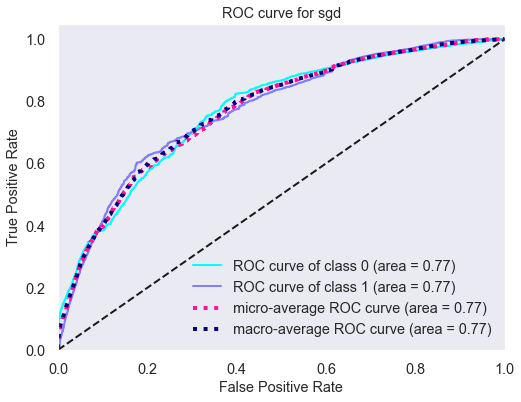

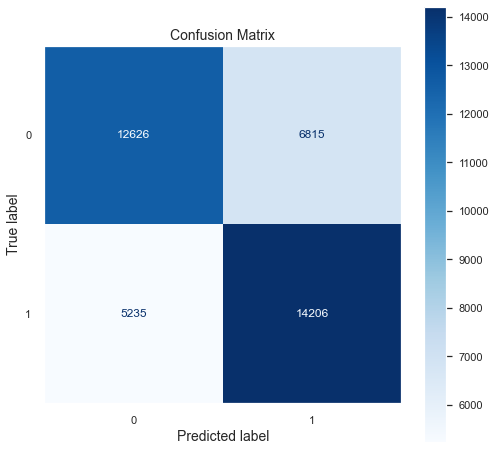



No feature importance for sgd






----------------------  logistic_regression  ----------------------


              precision    recall  f1-score   support

           0       0.80      0.77      0.78     19441
           1       0.78      0.80      0.79     19441

    accuracy                           0.79     38882
   macro avg       0.79      0.79      0.79     38882
weighted avg       0.79      0.79      0.79     38882



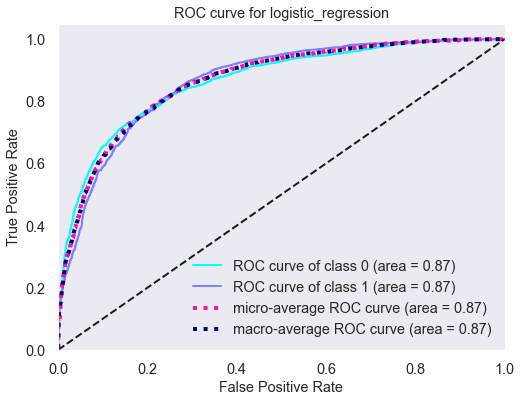

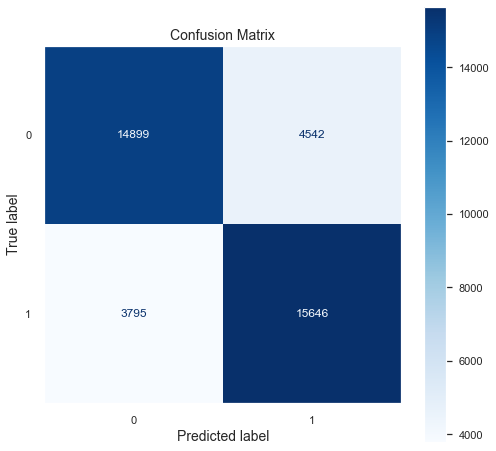

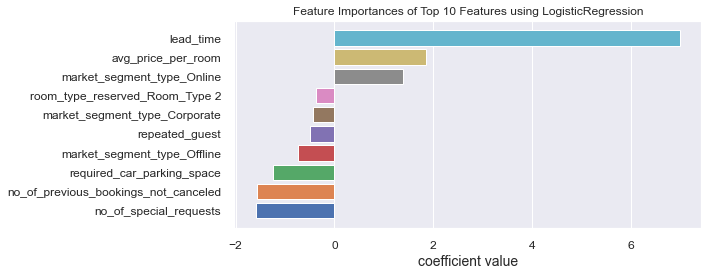

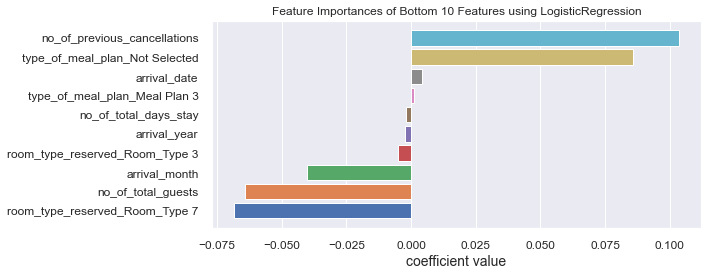







----------------------  support_vector_machine  ----------------------


              precision    recall  f1-score   support

           0       0.51      0.10      0.17     19441
           1       0.50      0.90      0.64     19441

    accuracy                           0.50     38882
   macro avg       0.51      0.50      0.41     38882
weighted avg       0.51      0.50      0.41     38882



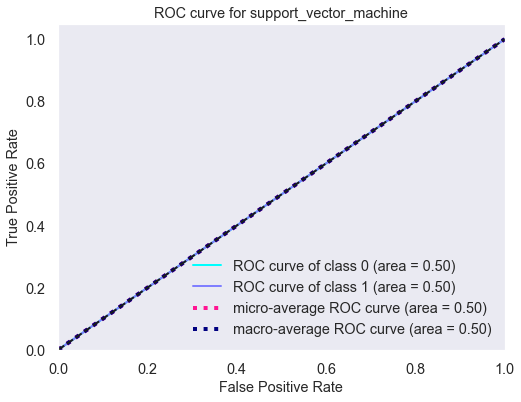

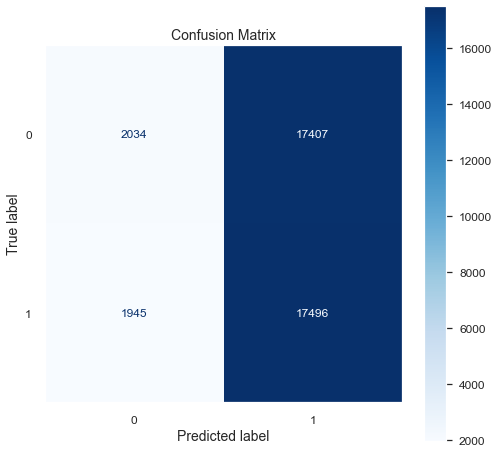



No feature importance for support_vector_machine






----------------------  decision_tree  ----------------------


              precision    recall  f1-score   support

           0       0.88      0.88      0.88     19441
           1       0.88      0.88      0.88     19441

    accuracy                           0.88     38882
   macro avg       0.88      0.88      0.88     38882
weighted avg       0.88      0.88      0.88     38882



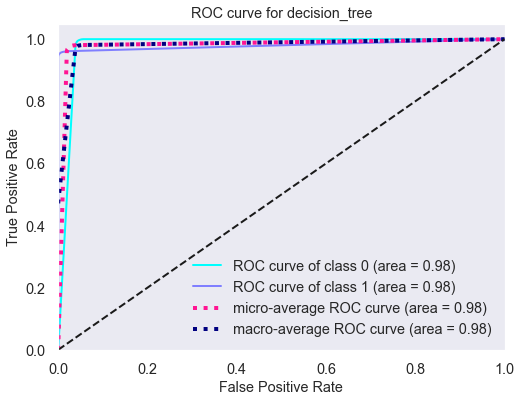

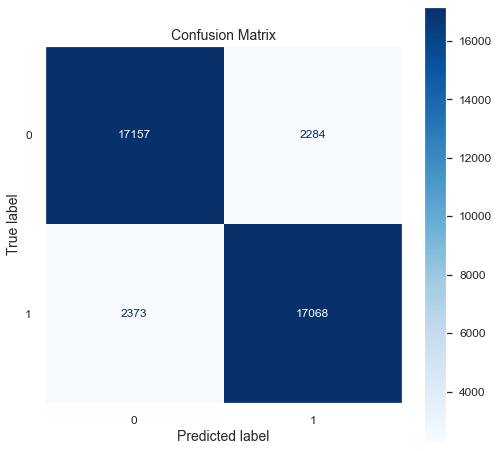

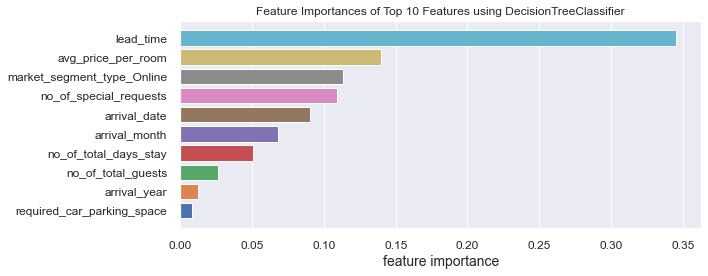

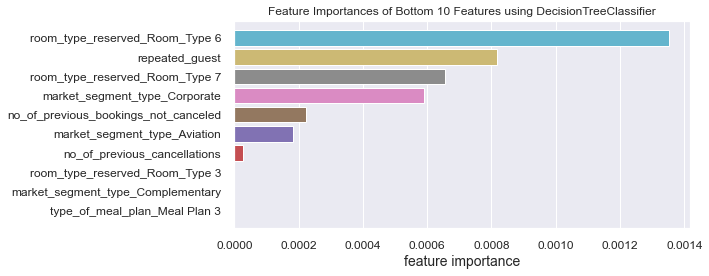







----------------------  random_forest  ----------------------


              precision    recall  f1-score   support

           0       0.91      0.92      0.92     19441
           1       0.92      0.91      0.92     19441

    accuracy                           0.92     38882
   macro avg       0.92      0.92      0.92     38882
weighted avg       0.92      0.92      0.92     38882



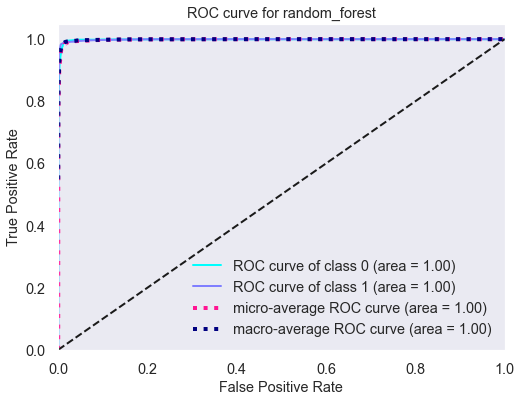

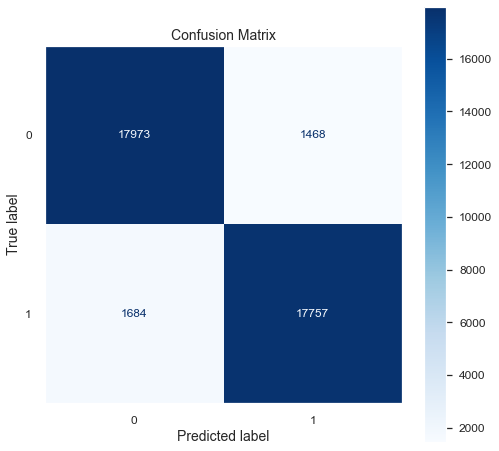

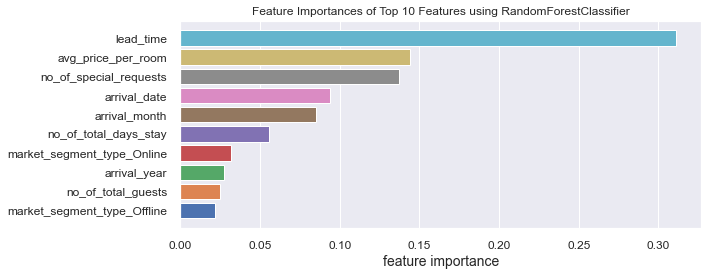

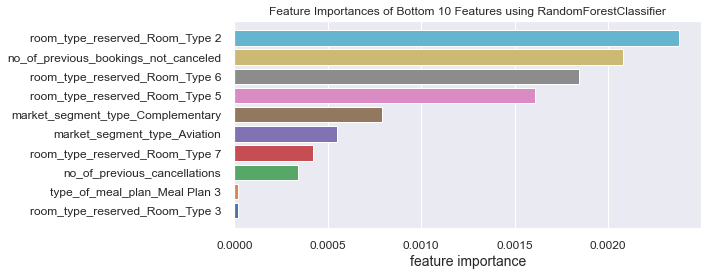







----------------------  gaussian_naive_bayes  ----------------------


              precision    recall  f1-score   support

           0       0.83      0.15      0.26     19441
           1       0.53      0.97      0.69     19441

    accuracy                           0.56     38882
   macro avg       0.68      0.56      0.47     38882
weighted avg       0.68      0.56      0.47     38882



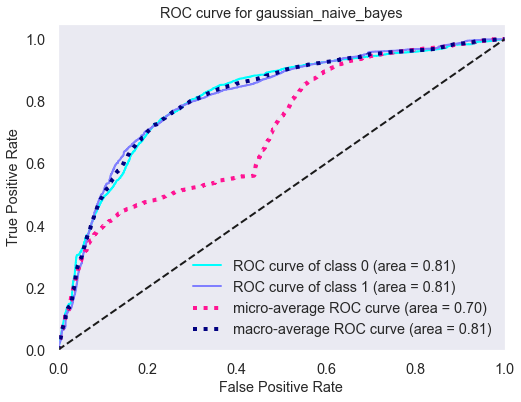

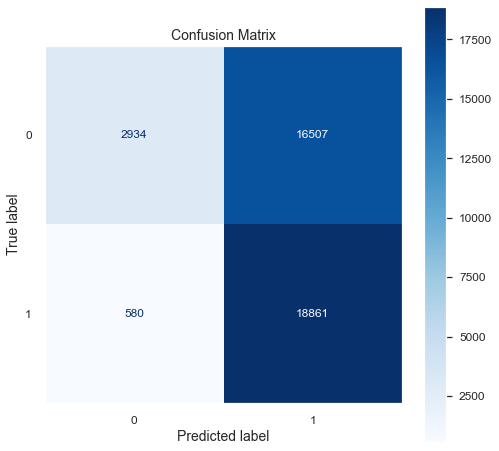



No feature importance for gaussian_naive_bayes






----------------------  k_nearest_neighbors  ----------------------


              precision    recall  f1-score   support

           0       0.89      0.79      0.84     19441
           1       0.82      0.91      0.86     19441

    accuracy                           0.85     38882
   macro avg       0.85      0.85      0.85     38882
weighted avg       0.85      0.85      0.85     38882



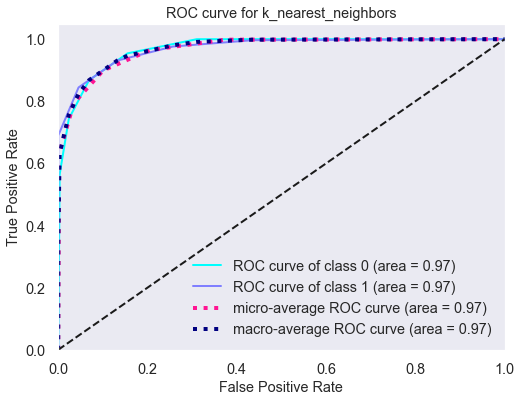

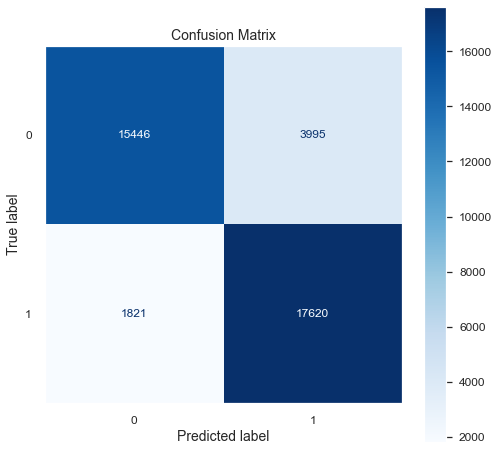



No feature importance for k_nearest_neighbors






----------------------  gradient_boosting  ----------------------


              precision    recall  f1-score   support

           0       0.83      0.85      0.84     19441
           1       0.85      0.83      0.84     19441

    accuracy                           0.84     38882
   macro avg       0.84      0.84      0.84     38882
weighted avg       0.84      0.84      0.84     38882



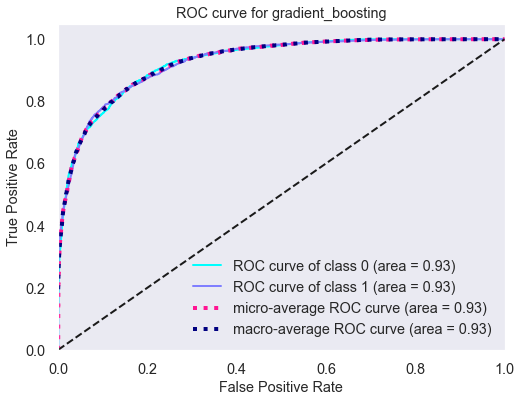

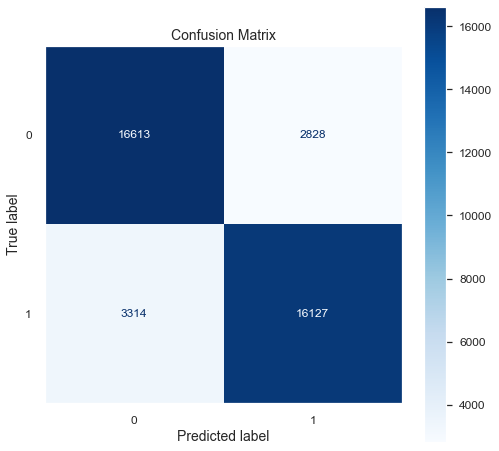

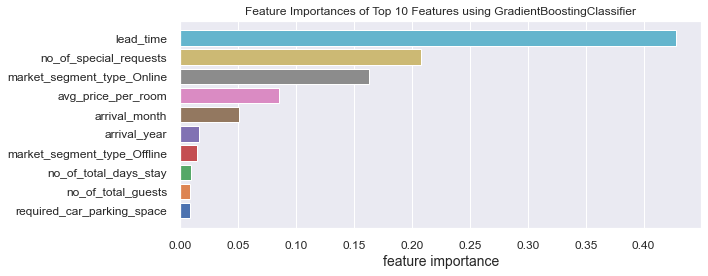

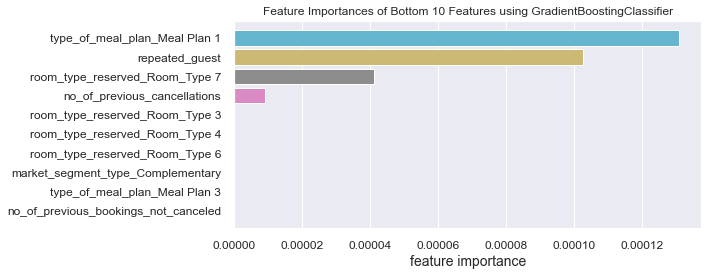







----------------------  linear_discriminant_analysis  ----------------------


              precision    recall  f1-score   support

           0       0.81      0.76      0.78     19441
           1       0.77      0.82      0.80     19441

    accuracy                           0.79     38882
   macro avg       0.79      0.79      0.79     38882
weighted avg       0.79      0.79      0.79     38882



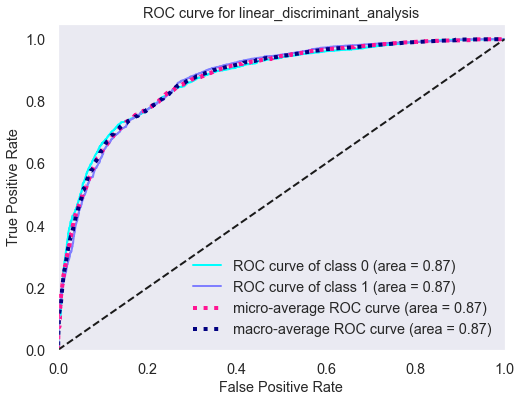

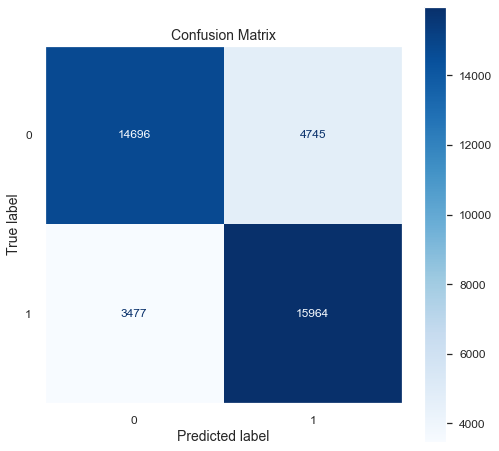

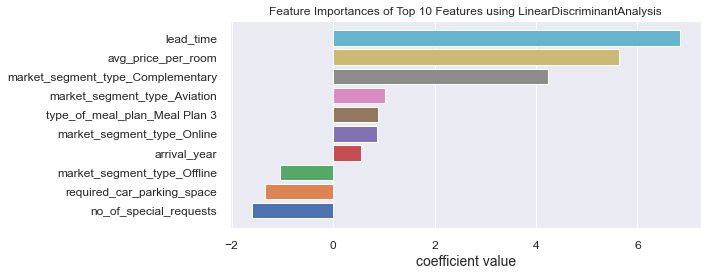

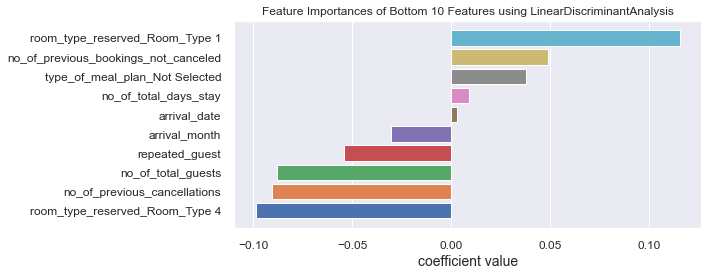







----------------------  bagging  ----------------------


              precision    recall  f1-score   support

           0       0.89      0.92      0.90     19441
           1       0.91      0.89      0.90     19441

    accuracy                           0.90     38882
   macro avg       0.90      0.90      0.90     38882
weighted avg       0.90      0.90      0.90     38882



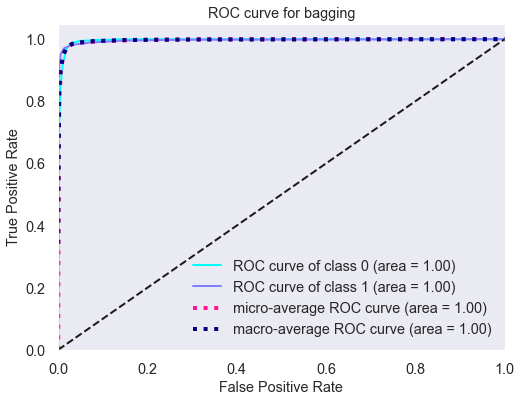

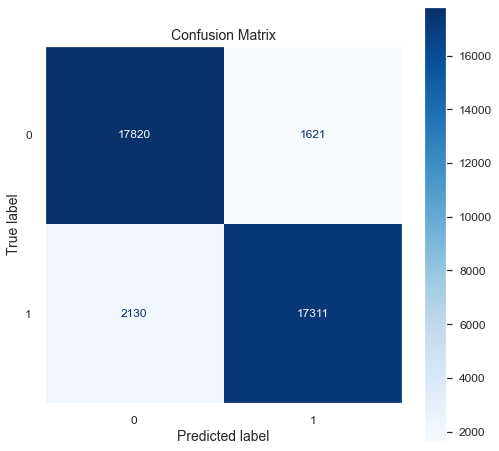



No feature importance for bagging






----------------------  neural_network  ----------------------


              precision    recall  f1-score   support

           0       0.80      0.70      0.75     19441
           1       0.73      0.82      0.77     19441

    accuracy                           0.76     38882
   macro avg       0.77      0.76      0.76     38882
weighted avg       0.77      0.76      0.76     38882



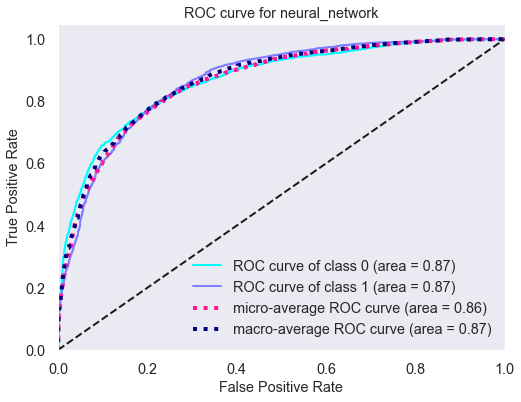

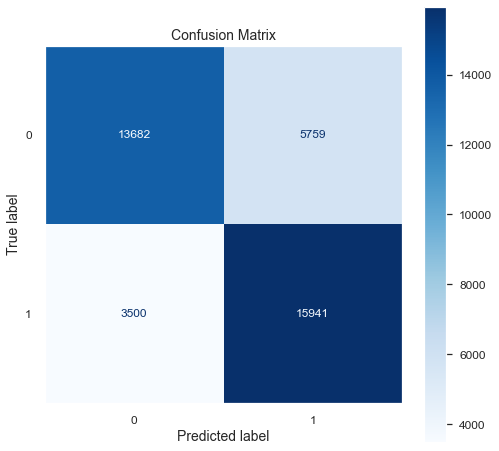



No feature importance for neural_network






----------------------  adaboost  ----------------------


              precision    recall  f1-score   support

           0       0.81      0.82      0.81     19441
           1       0.82      0.81      0.81     19441

    accuracy                           0.81     38882
   macro avg       0.81      0.81      0.81     38882
weighted avg       0.81      0.81      0.81     38882



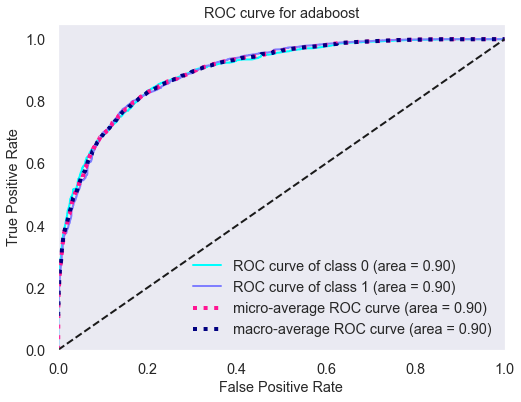

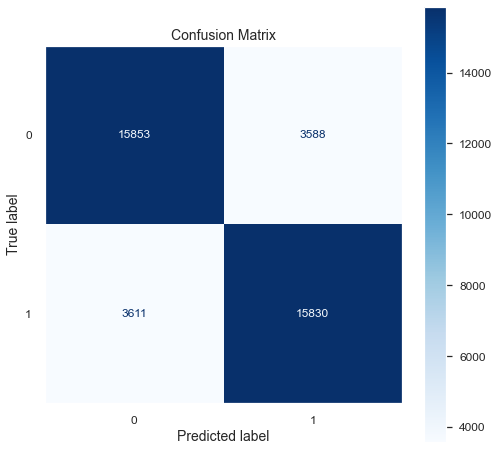

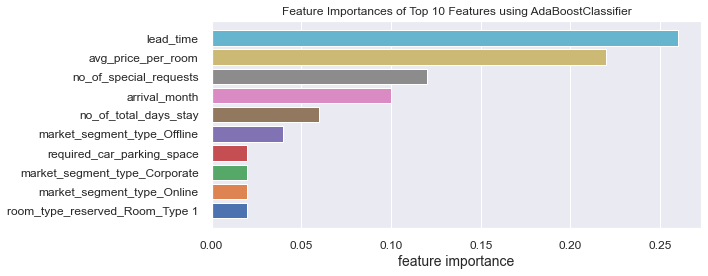

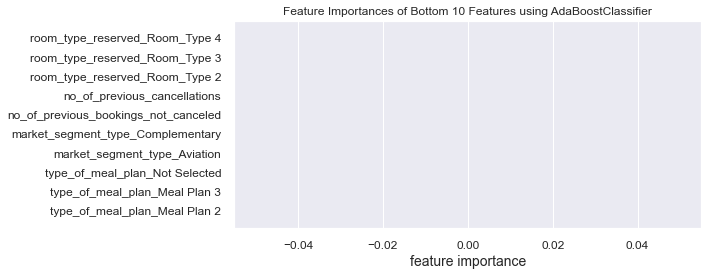







----------------------  extra_trees  ----------------------


              precision    recall  f1-score   support

           0       0.92      0.92      0.92     19441
           1       0.92      0.92      0.92     19441

    accuracy                           0.92     38882
   macro avg       0.92      0.92      0.92     38882
weighted avg       0.92      0.92      0.92     38882



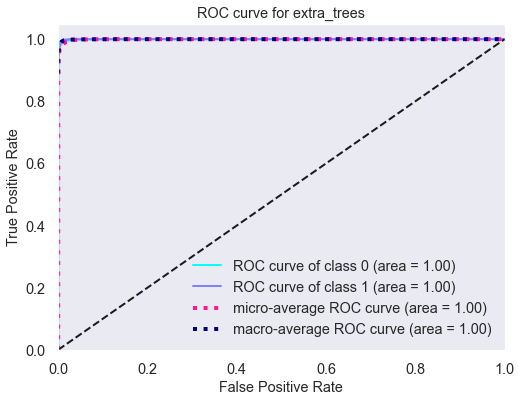

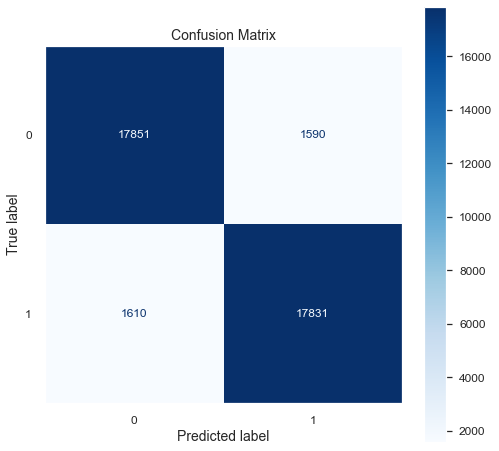

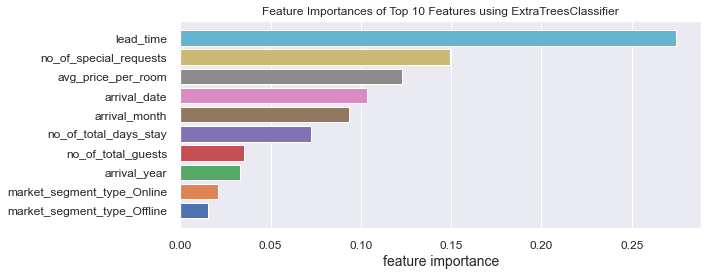

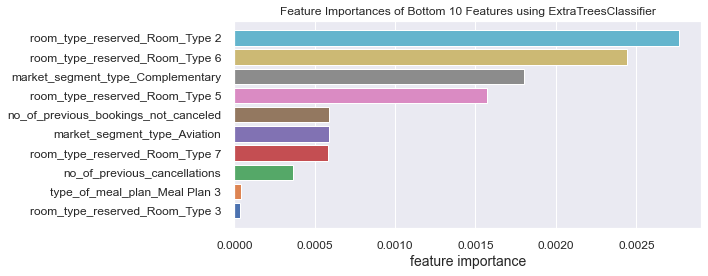

In [102]:


# loop over all the models
for model_name,model in classifiers.items():
    # title formatting
    print('\n')
    print('\n')
    print('  {}  '.center(50,'-').format(model_name))
    print('\n')
    # check if the folder for saving the model exists, if not create it
    folder_check_model()
    # train the model
    model_trn = train_model(model,model_name)
    # print the scores from the classification report
    score_func(model_trn, model_name)
    # plot the ROC curve
    roc_curve_func(model_trn,model_name)
    # plot the confusion matrix
    confusion_matrix_func(model_trn,model_name)
    # plot feature importance
    feat_importance_plot(model_trn, model_name)
    warnings.filterwarnings("ignore")



#### 4.3 Best performing Model

Using the ROC curve the f1-report, we can conclude that our top model is:
- Decesion Tree Model

### 5. Test the best model on test set

In [103]:
hr_test.head(5)

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,no_of_total_guests,no_of_total_days_stay
0,INN04976,2,0,0,2,Meal Plan 1,0,Room_Type 1,47,2018,2,19,Online,0,0,0,80.30,1,Not_Canceled,2,2
1,INN32106,2,0,2,1,Meal Plan 1,0,Room_Type 1,10,2018,9,11,Offline,0,0,0,95.00,0,Not_Canceled,2,3
2,INN20538,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Offline,0,0,0,100.00,0,Canceled,2,2
3,INN01468,2,0,1,2,Meal Plan 1,0,Room_Type 4,12,2018,5,30,Online,0,0,0,112.42,0,Canceled,2,3
4,INN34661,2,0,2,2,Meal Plan 1,0,Room_Type 1,134,2017,12,4,Offline,0,0,0,65.00,0,Not_Canceled,2,4


In [104]:
hr_test_prep = full_pipeline(hr_test)

In [105]:
# split the train data into X and y (target)
X_hr_test_prep, y_hr_test_prep = hr_test_prep.loc[:, hr_test_prep.columns != 'booking_status'], hr_test_prep['booking_status'].astype('int64')

In [106]:
# train the model
model_trn = train_model(classifiers['decision_tree'],'decision_tree')

In [107]:
final_predictions = model_trn.predict(X_hr_test_prep)

In [108]:
final_predictions.shape

(9804,)

In [109]:
n_correct = sum(final_predictions == y_hr_test_prep)

In [110]:
print(n_correct/len(final_predictions))

0.8457772337821298
